# Image Capture using InceptionV3 + Attention # 

## Data ##
In google My Drive I have:

- Flickr8k_Dataset.zip
- Flickr8k_text.zip

This model will use **Global Attention** - I also tested running Local Attention (Bahdanau) but I found the model to run very slowly in comparison, and no improvements in the BLEU scores.

I have found GRU approach to have slightly higher BLEU_1 score, and fairly similar BLEU_2 to BLEU_4 scores as LSTM.

##InceptionV3 Pre-trained Model##
This is based on https://github.com/SubhamIO/Image-Captioning-using-Attention-Mechanism-Local-Attention-and-Global-Attention-/blob/master/Image_Captioning_using_Attention_Mechanism.ipynb

I also tested with VGG16 but the InceptionV3 model does have improved loss cost (0.36) compared to VGG16 (0.56)



In [ ]:
try:
  %tensorflow_version 2.x
except Exception:
  pass
import tensorflow as tf
print(tf.__version__)

2.2.0


In [ ]:
# check Colab is pointing to the right Google My Drive (ie: not personal one)
#!ls -a '/root/.keras/datasets/'
#!ls -a '/content/drive/My Drive/'

# Mounting the Drive
Zipped image and text files are stored in Google My Drive, so first the drive is mounted and then the files are downloaded, accessible in /root/.keras/datasets/

In [9]:
%tensorflow_version 2.x
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [11]:
# Python Libraries
import numpy as np
from numpy import array
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import string
import pathlib
from PIL import Image
import glob
import pickle #import dump, load
from time import time
import tensorflow as tf

from tensorflow.keras.preprocessing import sequence
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Embedding, TimeDistributed, Dense, RepeatVector,\
                         Activation, Flatten, Reshape, Concatenate, Dropout, BatchNormalization, add, Add
from tensorflow.keras.layers import Conv2D, MaxPool2D
from tensorflow.keras.layers import Bidirectional
from tensorflow.keras.optimizers import Adam, RMSprop
from tensorflow.keras.applications.inception_v3 import InceptionV3, preprocess_input
#from tensorflow.keras.applications.vgg16 import VGG16, preprocess_input
from tensorflow.keras.preprocessing import image
from tensorflow.keras.models import Model
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras import Input, layers
from tensorflow.keras import optimizers
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.utils import plot_model
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from keras.backend.tensorflow_backend import set_session, repeat_elements

from collections import Counter 
import seaborn as sns
import sys, os, warnings 
import re
from pickle import load
from pickle import dump
import datetime

# Scikit-learn includes many helpful utilities
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle

Using TensorFlow backend.
/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


## **Loading the datasets into Colab**

In [12]:
# Select which Dataset - 8k or 30k images
# 'Flicker8k_Dataset', or, Flickr30k_Dataset
flikr_dataset='Flicker8k_Dataset'

In [13]:
# Read the Images to Keras/datasets
import tensorflow as tf

if flikr_dataset=='Flicker8k_Dataset':
    # Flickr8k_Dataset
    file_url = 'file:///content/drive/My Drive/Flickr8k_Dataset.zip'
    zip_dir = tf.keras.utils.get_file('Flickr8k_Dataset.zip', origin=file_url, extract=True)
    print(zip_dir)

    # Read the Text files
    file_url = 'file:///content/drive/My Drive/Flickr8k_text.zip'
    txt_dir = tf.keras.utils.get_file('Flickr8k_text.zip', origin=file_url, extract=True)
    print(txt_dir)

else:
    # Flickr30k_Dataset
    file_url = 'file:///content/drive/My Drive/31296_39911_bundle_archive.zip'
    zip_dir = tf.keras.utils.get_file('31296_39911_bundle_archive.zip', origin=file_url, extract=True)
    print(zip_dir)

/root/.keras/datasets/Flickr8k_Dataset.zip
/root/.keras/datasets/Flickr8k_text.zip


In [14]:
## The location of the Flickr8K_ photos
root_directory = pathlib.Path(zip_dir).parent
path = root_directory

## The location of the Flickr8K/30K_ photos
image_dir = root_directory / flikr_dataset # 30K/ flikr_dataset
images = os.listdir(image_dir)

print(root_directory)
print(image_dir)
print(f"The number of jpg flies in {flikr_dataset}: {format(len(images))}")

/root/.keras/datasets
/root/.keras/datasets/Flicker8k_Dataset
The number of jpg flies in Flicker8k_Dataset: 15091


In [15]:
# load doc into memory
def load_doc(filename):
	# open the file as read only
	file = open(filename, 'r')
	# read all text
	text = file.read()
	# close the file
	file.close()
	return text

if flikr_dataset=='Flickr30k_Dataset':
    train_filelist = []
    with open("/content/drive/My Drive/Flickr_30k.trainImages.txt") as file:
        train_filelist = [line.strip() for line in file]
    test_filelist = []
    with open("/content/drive/My Drive/Flickr_30k.testImages.txt") as file:
        test_filelist = [line.strip() for line in file]
    val_filelist = []
    with open("/content/drive/My Drive/Flickr_30k.devImages.txt") as file:
        val_filelist = [line.strip() for line in file] 

    val_filelist    

##**Functions to load and clean data**

In [16]:
# extract descriptions for images
def load_descriptions(doc):
	mapping = dict()
	# process lines
	for line in doc.split('\n'):
		# split line by white space
		tokens = line.split()
		if len(line) < 2:
			continue
		# take the first token as the image id, the rest as the description
		image_id, image_desc = tokens[0], tokens[1:]
		# remove filename from image id
		image_id = image_id.split('#')[0]
		# convert description tokens back to string
		image_desc = ' '.join(image_desc)
		# create the list if needed
		if image_id not in mapping:
			mapping[image_id] = list()
		# store description
		mapping[image_id].append(image_desc)
	return mapping


# steps through each description and cleans the text 
def clean_descriptions(descriptions):
	# prepare translation table for removing punctuation
	table = str.maketrans('', '', string.punctuation)
	for key, desc_list in descriptions.items():
		for i in range(len(desc_list)):
			desc = desc_list[i]
			# tokenize
			desc = desc.split()
			# convert to lower case
			desc = [word.lower() for word in desc]
			# remove punctuation from each token
			desc = [w.translate(table) for w in desc]
			# remove hanging 's' and 'a'
			desc = [word for word in desc if len(word)>1]
			# remove tokens with numbers in them
			desc = [word for word in desc if word.isalpha()]
			# store as string
			desc_list[i] =  ' '.join(desc)
 

# convert the loaded descriptions into a vocabulary of words
def to_vocabulary(descriptions):
	# build a list of all description strings
	all_desc = set()
	for key in descriptions.keys():
		[all_desc.update(d.split()) for d in descriptions[key]]
	return all_desc
 

# save descriptions to file, one per line
def save_descriptions(descriptions, filename):
	lines = list()
	for key, desc_list in descriptions.items():
		for desc in desc_list:
			lines.append(key + ' ' + desc)
	data = '\n'.join(lines)
	file = open(filename, 'w')
	file.write(data)
	file.close()
 

# The location of the caption file
filename = root_directory / 'Flickr8k.token.txt'

# load descriptions
doc = load_doc(filename)

# parse descriptions
descriptions = load_descriptions(doc)
print('Loaded: %d ' % len(descriptions))

# clean descriptions
clean_descriptions(descriptions)

# summarize vocabulary
vocabulary = to_vocabulary(descriptions)
print('Vocabulary Size: %d' % len(vocabulary))

# save to file
save_descriptions(descriptions, 'descriptions.txt')


Loaded: 8092 
Vocabulary Size: 8763


In [17]:
# load a pre-defined list of photo identifiers
def load_set(filename):
	doc = load_doc(filename)
	dataset = list()
	# process line by line
	for line in doc.split('\n'):
		# skip empty lines
		if len(line) < 1:
			continue
		# get the image identifier
		#identifier = line.split('.')[0]
		identifier = line.split('.')[0] + '.jpg'
		dataset.append(identifier)
	return set(dataset)

if flikr_dataset=='Flicker8k_Dataset':
		# load training dataset (6K)
		filename = root_directory /  'Flickr_8k.trainImages.txt'
		train = load_set(filename)
		print('Dataset: %d' % len(train))

		validation = load_set(root_directory /  'Flickr_8k.devImages.txt')
		print('Dataset: %d' % len(validation))

		test = load_set(root_directory /  'Flickr_8k.testImages.txt')
		print('Dataset: %d' % len(test))

Dataset: 6000
Dataset: 1000
Dataset: 1000


In [18]:
image_dir = str(image_dir)
root_directory = str(root_directory)
images = os.listdir(image_dir)

# Create a list of all image names in the directory
img = glob.glob(image_dir + '/*.jpg')

# Below file conatains the names of images to be used in train data
train_images_file = root_directory + '/Flickr_8k.trainImages.txt'
# Read the train image names in a set
train_images = set(open(train_images_file, 'r').read().strip().split('\n'))

# Below file conatains the names of images to be used in test data
val_images_file = root_directory + '/Flickr_8k.devImages.txt'
# Read the validation image names in a set# Read the test image names in a set
val_images = set(open(val_images_file, 'r').read().strip().split('\n'))

# Below file conatains the names of images to be used in test data
test_images_file = root_directory + '/Flickr_8k.testImages.txt'
# Read the validation image names in a set# Read the test image names in a set
test_images = set(open(test_images_file, 'r').read().strip().split('\n'))


## **Load clean descriptions into memory**

In [21]:
# load clean descriptions into memory
def load_clean_descriptions(filename, dataset):
	# load document
	doc = load_doc(filename)
	descriptions = dict()
	for line in doc.split('\n'):
		# split line by white space
		tokens = line.split()
		# split id from description
		image_id, image_desc = tokens[0], tokens[1:]
		# skip images not in the set
		if image_id in dataset:
			# create list
			if image_id not in descriptions:
				descriptions[image_id] = list()
			# wrap description in tokens
			# desc = 'startseq ' + ' '.join(image_desc) + ' endseq'
			desc = ' '.join(image_desc)
			# store
			descriptions[image_id].append(desc)
	return descriptions

# descriptions
train_descriptions = load_clean_descriptions('descriptions.txt', train)
print('Descriptions: train=%d' % len(train_descriptions))

val_descriptions = load_clean_descriptions('descriptions.txt', validation)
print('Descriptions: val  =%d' % len(val_descriptions))

test_descriptions = load_clean_descriptions('descriptions.txt', test)
print('Descriptions: test =%d' % len(test_descriptions))

Descriptions: train=6000
Descriptions: val  =1000
Descriptions: test =1000


In [ ]:
# Quick check
pd.DataFrame(test)

### **Checking if any file name references are invalid**##

In [22]:
def create_dataframe(descriptions):
    # Converting to user friendly data frame
    data = pd.DataFrame(descriptions).unstack().reset_index()
    # Proper column names
    data = data.rename(columns={'level_0':'filename','level_1':'index',0:'caption'})
    # Reordering columns for better readability
    data = data.reindex(columns =['index','filename','caption'])
    return data

data_train = create_dataframe(train_descriptions)
data_val = create_dataframe(val_descriptions)
data_test = create_dataframe(test_descriptions)

# This image data is invalid - file does not exist - remove from data
# It's not in the 3 train/dev/test files - here for future reference only
data_train[data_train['filename'] == '2258277193_586949ec62.jpg.1']

,index,filename,caption


In [23]:
# Remove rows with invalid filename
data_train = data_train[data_train['filename'] != '2258277193_586949ec62.jpg.1']
#data_train.append(data_val)
data_all = pd.concat([data_train, data_val])
len(data_all)

35000

##**Functions for assisting with EDA**

- Making a dataframe out of raw text
- File information


In [24]:
def make_dataset(text):
  df = []
  for sentences in text.split('\n'):
      splitted = sentences.split('\t')
      if len(splitted) == 1:
          continue
      w = splitted[0].split("#")
      df.append(w + [splitted[1].lower()])
  return df

# If any filename dosn't have .jpg extension at last then mark it as Invalid filename
def invalid_filename_check(data):
  for filenames in data["filename"]:
    found = re.search("(.(jpg)$)", filenames)
    if (found):
        pass
    else:
        print("Error file: {}".format(filenames))

def utility_counter(data):

  unique_filenames = np.unique(data.filename.values)
  print("The number of unique file names : {}".format(len(unique_filenames)))

  ct_dict = Counter(data.filename.values)
  print("We can see that all the keys are having values count = 5")
  print({k: ct_dict[k] for k in list(ct_dict)[:3]})

  print("The distribution of the number of captions for each image:")
  ct = Counter(Counter(data.filename.values).values())
  print(ct)
  return unique_filenames

unique_filenames = utility_counter(data_train)  


The number of unique file names : 6000
We can see that all the keys are having values count = 5
{'1000268201_693b08cb0e.jpg': 5, '1001773457_577c3a7d70.jpg': 5, '1002674143_1b742ab4b8.jpg': 5}
The distribution of the number of captions for each image:
Counter({5: 6000})


##**Preprocess Images**##

In [25]:
def preprocess_images(data):
  all_img_name_vector = []

  for filenames in data["filename"]:
      full_image_path = image_dir +'/'+ filenames
      all_img_name_vector.append(full_image_path)
  return all_img_name_vector

img_name_vector = preprocess_images(data_train)
img_name_vector[:3]

val_img_name_vector = preprocess_images(data_val)
val_img_name_vector[:3]

test_img_name_vector = preprocess_images(data_test)
test_img_name_vector[:3]

['/root/.keras/datasets/Flicker8k_Dataset/1056338697_4f7d7ce270.jpg',
 '/root/.keras/datasets/Flicker8k_Dataset/1056338697_4f7d7ce270.jpg',
 '/root/.keras/datasets/Flicker8k_Dataset/1056338697_4f7d7ce270.jpg']

In [26]:
def preprocess_captions(data):
  total_captions = []

  for caption in data["caption"].astype(str):
      caption = '<start> ' + caption+ ' <end>'
      total_captions.append(caption)
  return total_captions

train_captions = preprocess_captions(data_train)
train_captions[:3]

val_captions = preprocess_captions(data_val)
val_captions[:3]

test_captions = preprocess_captions(data_test)
test_captions[:3]

['<start> blond woman in blue shirt appears to wait for ride <end>',
 '<start> blond woman is on the street hailing taxi <end>',
 '<start> woman is signaling is to traffic as seen from behind <end>']

**Combining Train and Validation data for training/testing model**

In [27]:
all_img_name_vector = img_name_vector + val_img_name_vector
print(len(all_img_name_vector))

all_train_captions = train_captions + val_captions
print(len(all_train_captions))

35000
35000


**These were not required for Attention model, but I have kept here for reference when using classic pre-training CNN/RNN modelling**

In [ ]:
def create_vocabulary(data):
  vocab = []
  for captions in data.caption.values:
    vocab.extend(captions.split())
  print("Vocabulary Size : {}".format(len(set(vocab))))
  return vocab

def filter_vocabulary(min_occuring, dfwordcount):
  dfcount = pd.DataFrame(dfwordcount)
  dfcount = dfcount[dfcount['count']>min_occuring].rename(columns={'word':'caption'})
  return create_vocabulary(dfcount)

def df_word_count(data,vocabulary):
    ct = Counter(vocabulary)
    appen_1 = []
    appen_2 = []
    for i in ct.keys():
        appen_1.append(i)
    for j in ct.values():
        appen_2.append(j)
    data = {"word":appen_1 , "count":appen_2}
    dfword = pd.DataFrame(data)
    dfword = dfword.sort_values(by='count', ascending=False)
    dfword = dfword.reset_index()[["word","count"]]
    return(dfword)

# initial vocabulary before filtering
vocabulary = create_vocabulary(data_all)

# word counts of initial vocabulary
dfwordcount = df_word_count(data_all,vocabulary)    

# filter out words occuring < 5 times, return new vocabulary
vocabulary = filter_vocabulary(5, dfwordcount)
print(pd.DataFrame(vocabulary))

In [28]:
print("Train Captions      = {0} , Total images = {1}".format(len(train_captions),len(img_name_vector)))
print("Validation Captions = {0}  , Total images = {1}".format(len(val_captions),len(val_img_name_vector)))
print("Test Captions       = {0}  , Total images = {1}".format(len(test_captions),len(test_img_name_vector)))
print("Train/Val Captions  = {0} , Total images = {1}".format(len(all_train_captions),len(all_img_name_vector)))

Train Captions      = 30000 , Total images = 30000
Validation Captions = 5000  , Total images = 5000
Test Captions       = 5000  , Total images = 5000
Train/Val Captions  = 35000 , Total images = 35000


###**Since we are using pre-trained model InceptionV3, images must be resized to (229, 229, 3)**

In [29]:
# Resizing of images
def load_image(image_path):
    img = tf.io.read_file(image_path)
    img = tf.image.decode_jpeg(img, channels=3)
    img = tf.image.resize(img, (229, 229))
    img = preprocess_input(img)
    return img, image_path

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Shape after resize : (229, 229, 3)
/root/.keras/datasets/Flicker8k_Dataset/3439243433_d5f3508612.jpg


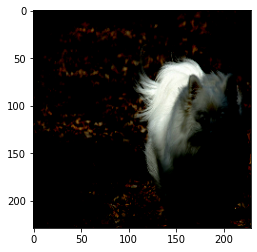

In [62]:
img1,img1_path = load_image(image_dir + '/3439243433_d5f3508612.jpg')  #3439243433_d5f3508612.jpg, 2258277193_586949ec62.jpg
print("Shape after resize :", img1.shape) 
print(img1_path)
plt.imshow(img1)

###**Functions for Image Augmentation**
Augmenation helps the model to understand images at different angles and orientations. Although this hasn't been used in this model training, is good for future reference and further investigations.


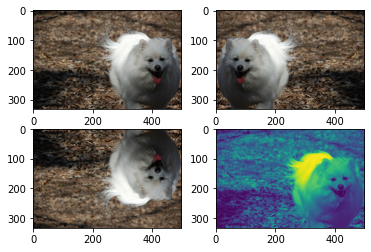

In [ ]:
import imageio
def image_flipper(image):
  original_img = imageio.imread(image)
  plt.figure(1)

#Original Image

  plt.subplot(221)
  plt.imshow(original_img)

#Left-Right flip Image

  flipped_img_tensor = tf.image.flip_left_right(original_img)
  flipped_img= flipped_img_tensor.numpy()
  plt.subplot(222)
  plt.imshow(flipped_img)

#Up-Down flip Image

  upside_down_flip_tensor = tf.image.flip_up_down(original_img)
  upside_down_flip= upside_down_flip_tensor.numpy()
  plt.subplot(223)
  plt.imshow(upside_down_flip)

#Gray scale Image

  gray_tensor = tf.image.rgb_to_grayscale(original_img)
  grayimg= gray_tensor.numpy()
  plt.subplot(224)
  plt.imshow(tf.squeeze(grayimg))

  #plt.imsave('doggo.jpg',flipped_img)

image_flipper(image_dir + '/3439243433_d5f3508612.jpg')

##**Image Histograms**
- Histogram is considered as a graph or plot which is related to frequency of pixels in an Gray Scale Image with pixel values (ranging from 0 to 255). 
- Grayscale image is an image in which the value of each pixel is a single sample, that is, it carries only intensity information where pixel value varies from 0 to 255

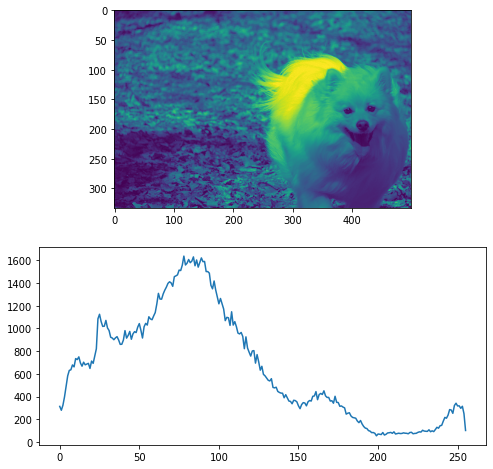

In [ ]:
# importing required libraries of opencv 
import cv2 
# importing library for plotting 
from matplotlib import pyplot as plt 
def plot_image_histograms(image): 
  # reads an input image 
  img = cv2.imread(image,0) 
  # find frequency of pixels in range 0-255 
  histr = cv2.calcHist([img],[0],None,[256],[0,256]) 
    
  # show the plotting graph of an image 
  fig = plt.figure(figsize=(8, 8))
  plt.subplot(2,1,1)
  plt.imshow(img)
  plt.subplot(2,1,2)
  plt.plot(histr) 
  plt.show() 

plot_image_histograms(image_dir + '/' + '3439243433_d5f3508612.jpg')

##**Feature Extraction - InceptionV3**##
Create an InceptionV3 model as a feature extractor. This will create a 2048 element vector as the output. For Attention, we are not using average pooling in this model so must keep as a 4D tensor, do not convert to a 2D tensor.


In [30]:
# Pre-Trained Image Model (InceptionV3)
mage_model = InceptionV3(include_top=False, weights='imagenet', input_shape=(229, 229, 3))

new_input = image_model.input # Any arbitrary shapes with 3 channels
hidden_layer = image_model.layers[-1].output

image_features_extract_model = tf.keras.Model(new_input, hidden_layer)

image_features_extract_model.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 229, 229, 3) 0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 114, 114, 32) 864         input_1[0][0]                    
__________________________________________________________________________________________________
batch_normalization (BatchNorma (None, 114, 114, 32) 96          conv2d[0][0]                     
__________________________________________________________________________________________________
activation (Activation)         (None, 114, 114, 32) 0           batch_normalization[0][0]        
______________________________________________________________________________________________

##**Assigning Train, Validation and Test data for model training and evaluation process.**



In [31]:
# Do not use default function - use specific Flikr8K train/dev/test data
# Create training and test set using an 80-20 split
# img_name_train, img_name_test, caption_train, caption_test = train_test_split(img_name_vector,train_captions,test_size=0.2,random_state=0)

img_name_train = img_name_vector
img_name_val = val_img_name_vector
img_name_test = test_img_name_vector
img_name_all = all_img_name_vector

caption_train = train_captions
caption_val = val_captions
caption_test = test_captions
caption_all = all_train_captions

print("Training Data : X = {0}, Y = {1}".format(len(img_name_train), len(caption_train)))
print("Val Data      : X = {0},  Y = {1}".format(len(img_name_val), len(caption_val)))
print("Test Data     : X = {0},  Y = {1}".format(len(img_name_test), len(caption_test)))
print("Train/Val Data: X = {0}, Y = {1}".format(len(img_name_all), len(caption_all)))

Training Data : X = 30000, Y = 30000
Val Data      : X = 5000,  Y = 5000
Test Data     : X = 5000,  Y = 5000
Train/Val Data: X = 35000, Y = 35000


##**Features extraction from InceptionV3**##

- create dataset where elements are slices of the given tensors
- Map each image name to the function to load the image

In [32]:
# Get unique images
#encode_train = sorted(set(img_name_train))
encode_train = sorted(set(img_name_all))
encode_test = sorted(set(img_name_val))

print(encode_train[:5])
print(encode_test[:5])

# create dataset where elements are slices of the given tensors
image_dataset = tf.data.Dataset.from_tensor_slices(encode_train)
image_data_test = tf.data.Dataset.from_tensor_slices(encode_test)

# Map each image name to the function to load the image
image_dataset = image_dataset.map(load_image, num_parallel_calls=tf.data.experimental.AUTOTUNE).batch(60)
image_data_test = image_data_test.map(load_image, num_parallel_calls=tf.data.experimental.AUTOTUNE).batch(50)

image_dataset

['/root/.keras/datasets/Flicker8k_Dataset/1000268201_693b08cb0e.jpg', '/root/.keras/datasets/Flicker8k_Dataset/1001773457_577c3a7d70.jpg', '/root/.keras/datasets/Flicker8k_Dataset/1002674143_1b742ab4b8.jpg', '/root/.keras/datasets/Flicker8k_Dataset/1003163366_44323f5815.jpg', '/root/.keras/datasets/Flicker8k_Dataset/1007129816_e794419615.jpg']
['/root/.keras/datasets/Flicker8k_Dataset/1022454332_6af2c1449a.jpg', '/root/.keras/datasets/Flicker8k_Dataset/103106960_e8a41d64f8.jpg', '/root/.keras/datasets/Flicker8k_Dataset/1032122270_ea6f0beedb.jpg', '/root/.keras/datasets/Flicker8k_Dataset/1034276567_49bb87c51c.jpg', '/root/.keras/datasets/Flicker8k_Dataset/1045521051_108ebc19be.jpg']


<BatchDataset shapes: ((None, 229, 229, 3), (None,)), types: (tf.float32, tf.string)>

##**NumPy array file**
An NPY file is a NumPy array file created by the Python software package with the NumPy library installed. It contains an array saved in the NumPy (NPY) file format. NPY files store all the information required to reconstruct an array on any computer, which includes dtype and shape information.

In [33]:
from tqdm import tqdm

# Training data
for img, path in image_dataset:
  batch_features = image_features_extract_model(img)
  batch_features = tf.reshape(batch_features,
                              (batch_features.shape[0], -1, batch_features.shape[3]))

  for bf, p in zip(batch_features, path):
    path_of_feature = p.numpy().decode("utf-8")
    np.save(path_of_feature, bf.numpy())


# Validation (test) data
for img, path in image_data_test:
  batch_features = image_features_extract_model(img)
  batch_features = tf.reshape(batch_features,
                              (batch_features.shape[0], -1, batch_features.shape[3]))

  for bf, p in zip(batch_features, path):
    path_of_feature = p.numpy().decode("utf-8")
    np.save(path_of_feature, bf.numpy())


In [34]:
# check that above step worked correctly
np_img =np.load('/root/.keras/datasets/Flicker8k_Dataset/1000268201_693b08cb0e.jpg.npy')
print(np_img)
print("Shape : {}".format(np_img.shape))

[[0.6232539  1.1592996  0.42443246 ... 0.7182333  0.40823454 0.        ]
 [0.         1.4683006  0.94630224 ... 1.1904525  1.3045416  0.16742474]
 [0.         0.         0.5942095  ... 1.6213676  1.6221801  0.3436834 ]
 ...
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.17400758 0.1552449  ... 0.         0.         0.        ]]
Shape : (25, 2048)


##**Data Preparation for a Language Generation(RNN) DECODER**
1. We will perform a few basic pre-processing steps on the captions such as:
First, we will tokenize the captions. This will help us to build a vocabulary of all the unique words in the data.
2. Next, we will limit the vocabulary size to top 5000 words to save memory. We will replace all the other words with the token < unk > (for words not in vocabulary) . You , can obviously optimize that according to the use cases.
3. Finally, we will create a word->index mapping and vice versa.
4. We will pad all sequences to be the same length as the longest one.

In [35]:
def tokenize_caption(top_k, train_captions):
  # Choose the top 5000 words from the vocabulary
  tokenizer = tf.keras.preprocessing.text.Tokenizer(num_words=top_k,
                                                    oov_token="<unk>",
                                                    filters='!"#$%&()*+.,-/:;=?@[\]^_`{|}~ ')
  # oov_token: if given, it will be added to word_index and used to replace out-of-vocabulary words during text_to_sequence calls
  
  tokenizer.fit_on_texts(train_captions)
  train_seqs = tokenizer.texts_to_sequences(train_captions)

  # Map '<pad>' to '0'
  tokenizer.word_index['<pad>'] = 0
  tokenizer.index_word[0] = '<pad>'

  # Create the tokenized vectors
  train_seqs = tokenizer.texts_to_sequences(train_captions)
  return train_seqs, tokenizer

train_seqs , tokenizer = tokenize_caption(8000, caption_all)  # caption_train

val_seqs , tokenizer_val = tokenize_caption(5000, caption_val)

test_seqs , tokenizer_test = tokenize_caption(5000, caption_test)


In [68]:
caption_test[:3]

['<start> blond woman in blue shirt appears to wait for ride <end>',
 '<start> blond woman is on the street hailing taxi <end>',
 '<start> woman is signaling is to traffic as seen from behind <end>']

In [69]:
test_seqs[:3]

[[2, 291, 19, 5, 28, 38, 775, 21, 1095, 76, 258, 3],
 [2, 291, 19, 7, 6, 4, 68, 1792, 1370, 3],
 [2, 19, 7, 1793, 7, 21, 625, 71, 776, 82, 117, 3]]

**MaxLength and MinLength of any captions**

In [36]:
# Find the maximum length of any caption in our dataset
def calc_max_length(tensor):
    return max(len(t) for t in tensor)

# Calculates the max_length, which is used to store the attention weights
max_length = calc_max_length(train_seqs)
max_length_val = calc_max_length(val_seqs)
max_length_test = calc_max_length(test_seqs)

# Find the maximum length of any caption in our dataset
def calc_min_length(tensor):
    return min(len(t) for t in tensor)

# Calculates the max_length, which is used to store the attention weights
min_length = calc_min_length(train_seqs)
min_length_val = calc_min_length(val_seqs)
min_length_test = calc_min_length(test_seqs)

print('Max Length of any (Train) caption : Min Length of any (Train) caption = '+ str(max_length) +" : "+str(min_length))
print('Max Length of any (Val)   caption : Min Length of any (Val)   caption = '+ str(max_length_val) +" : "+str(min_length_val))
print('Max Length of any (Test)  caption : Min Length of any (Test)  caption = '+ str(max_length_test) +" : "+str(min_length_test))


Max Length of any (Train) caption : Min Length of any (Train) caption = 34 : 3
Max Length of any (Val)   caption : Min Length of any (Val)   caption = 31 : 4
Max Length of any (Test)  caption : Min Length of any (Test)  caption = 30 : 3


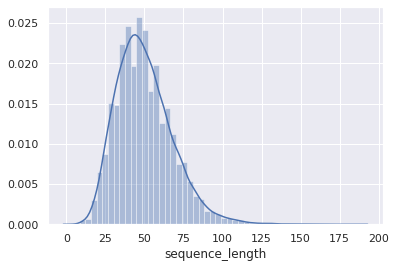

In [71]:
import seaborn as sns

df=pd.DataFrame()
df["sequence_length"] = data_all["caption"].apply(len)

sns.set()
distribution = sns.distplot(df["sequence_length"])

###**Pad each vector to the max_length of the captions, so that all caption vectors are of same length**###

In [37]:
def padding_train_sequences(train_seqs,max_length,padding_type):
  cap_vector = tf.keras.preprocessing.sequence.pad_sequences(train_seqs, padding=padding_type,maxlen=max_length)
  return cap_vector

padded_caption_vector = padding_train_sequences(train_seqs, max_length, 'post') 

padded_caption_val = padding_train_sequences(val_seqs, max_length_val, 'post') 

padded_caption_test = padding_train_sequences(test_seqs, max_length_test, 'post') 

padded_caption_vector

array([[  2,  43,   4, ...,   0,   0,   0],
       [  2,  19, 311, ...,   0,   0,   0],
       [  2,  40,  19, ...,   0,   0,   0],
       ...,
       [  2,  15,   9, ...,   0,   0,   0],
       [  2,  15,   9, ...,   0,   0,   0],
       [  2,   5,  15, ...,   0,   0,   0]], dtype=int32)

**Splitting the Train/Validation data** (from above) into Train/Test data for the model. We had to do this to get the right batch_size for the training process.

In [38]:
# Create training and validation sets using an 80-20 split
img_name_train, img_name_val, cap_train, cap_val = train_test_split(all_img_name_vector,
                                                                    padded_caption_vector,
                                                                    test_size=0.15,
                                                                    random_state=0)

len(img_name_train), len(cap_train), len(img_name_val), len(cap_val)

(29750, 29750, 5250, 5250)

###**Creating the datasets**###

In [39]:
BATCH_SIZE = 50
BUFFER_SIZE = 1000

embedding_dim = 512
units = 512
vocab_size = len(tokenizer.word_index) + 1     #8768
num_steps = len(img_name_train) // BATCH_SIZE  #505

# Shape from last layer of VGG-16 :(7,7,512)
# So, say there are 49 pixel locations now and each pixel is 512 dimensional
features_shape = 2048           #512
attention_features_shape = 64   #49

def load_npy(img_name, cap):
  img_tensor = np.load(img_name.decode('utf-8')+'.npy')
  return img_tensor, cap

'''
# How Dataset.from_tensor_slices work
t = tf.constant([[1, 2], [3, 4]])
ds = tf.data.Dataset.from_tensor_slices(t)   # [1, 2], [3, 4]
ds # <TensorSliceDataset shapes: (2,), types: tf.int32>
'''
def create_dataset(img_name_data, caption_data):
  dataset = tf.data.Dataset.from_tensor_slices((img_name_data, caption_data))

  # Use map to load the numpy files in parallel
  dataset = dataset.map(lambda item1, item2: tf.numpy_function(load_npy, [item1, item2], [tf.float32, tf.int32]),
                        num_parallel_calls=tf.data.experimental.AUTOTUNE)
  # Shuffle and batch
  dataset = dataset.shuffle(BUFFER_SIZE).batch(BATCH_SIZE).prefetch(buffer_size=tf.data.experimental.AUTOTUNE)
  return dataset

# Creating training  dataset
dataset = create_dataset(img_name_train, cap_train)

# validation (test) dataset during training
test_dataset = create_dataset(img_name_val, cap_val) 


**Need a whole numbers** for the batches to be processed correctly in the attention code, or it throws and error.

In [40]:
num_elements = tf.data.experimental.cardinality(dataset).numpy()
num_elements

595

###**CNN ENCODER:**###
Now, let's define the CNN ENCODER, that will be the single fully connected layer followed by ReLU activation.

In [41]:
# https://www.tensorflow.org/tutorials/text/image_captioning
class CNN_Encoder(tf.keras.Model):
    # This encoder passes the features through a Fully connected layer
    def __init__(self, embedding_dim):
        super(CNN_Encoder, self).__init__()
        # shape after fc == (batch_size, 49, embedding_dim)
        self.fc = tf.keras.layers.Dense(embedding_dim)
        #self.dropout = tf.keras.layers.Dropout(0.5, noise_shape=None, seed=None)

    def call(self, x):
        #x= self.dropout(x)
        x = self.fc(x)
        x = tf.nn.relu(x)
        return x

In [42]:
# GRU OR LSTM
rnn_type='GRU'

# local or global
attention_choice='global'

###**RNN DECODER and BAHDANAU ATTENTION(LOCAL ATTENTION) MECHANISM:**
In the RNN Decoder we will also define the Attention Mechanism. We will need the features from the CNN ENCODER . This Attention Mechanism will return the context vector and attention weights over the time axis.

In [254]:
'''The encoder output(i.e. 'features'), hidden state(initialized to 0)(i.e. 'hidden') and 
the decoder input (which is the start token)(i.e. 'x') is passed to the decoder.'''

class Rnn_Local_Decoder(tf.keras.Model):
  def __init__(self, embedding_dim, units, vocab_size):
    super(Rnn_Local_Decoder, self).__init__()
    self.units = units

    self.embedding = tf.keras.layers.Embedding(vocab_size, embedding_dim)
    self.gru = tf.keras.layers.GRU(self.units,
                                   return_sequences=True,
                                   return_state=True,
                                   recurrent_initializer='glorot_uniform')
    if rnn_type=='LSTM':
        self.lstm = tf.keras.layers.LSTM(self.units, 
                                        return_sequences=True, 
                                        return_state=True, 
                                        recurrent_initializer='glorot_uniform')   
    else:
        self.gru = tf.keras.layers.GRU(self.units,
                                  return_sequences=True,
                                  return_state=True,
                                  recurrent_initializer='glorot_uniform') 
           
    self.fc1 = tf.keras.layers.Dense(self.units)

    self.dropout = tf.keras.layers.Dropout(0.5, noise_shape=None, seed=None)
    self.batchnormalization = tf.keras.layers.BatchNormalization(axis=-1, momentum=0.99, epsilon=0.001, center=True, scale=True, beta_initializer='zeros', gamma_initializer='ones', moving_mean_initializer='zeros', moving_variance_initializer='ones', beta_regularizer=None, gamma_regularizer=None, beta_constraint=None, gamma_constraint=None)

    self.fc2 = tf.keras.layers.Dense(vocab_size)

    # Implementing Attention Mechanism 
    self.Uattn = tf.keras.layers.Dense(units)
    self.Wattn = tf.keras.layers.Dense(units)
    self.Vattn = tf.keras.layers.Dense(1)
    


  def call(self, x, features, hidden):
    
    # features shape ==> (64,49,256) ==> Output from ENCODER
    
    # hidden shape == (batch_size, hidden_size) ==>(64,512)
    # hidden_with_time_axis shape == (batch_size, 1, hidden_size) ==> (64,1,512)
    
    hidden_with_time_axis = tf.expand_dims(hidden, 1)
    
    # score shape == (64, 49, 1)
    # Attention Function
    '''e(ij) = f(s(t-1),h(j))'''
    ''' e(ij) = Vattn(T)*tanh(Uattn * h(j) + Wattn * s(t))'''
    score = self.Vattn(tf.nn.tanh(self.Uattn(features) + self.Wattn(hidden_with_time_axis)))
    # self.Uattn(features) : (64,49,512)
    # self.Wattn(hidden_with_time_axis) : (64,1,512)
    # tf.nn.tanh(self.Uattn(features) + self.Wattn(hidden_with_time_axis)) : (64,49,512)
    # self.Vattn(tf.nn.tanh(self.Uattn(features) + self.Wattn(hidden_with_time_axis))) : (64,49,1) ==> score
    # you get 1 at the last axis because you are applying score to self.Vattn
    
    
    # Then find Probability using Softmax
    '''attention_weights(alpha(ij)) = softmax(e(ij))'''
    attention_weights = tf.nn.softmax(score, axis=1)
    # attention_weights shape == (64, 49, 1)

    
    # Give weights to the different pixels in the image
    ''' C(t) = Summation(j=1 to T) (attention_weights * VGG-16 features) ''' 
    context_vector = attention_weights * features
    context_vector = tf.reduce_sum(context_vector, axis=1)
    # Context Vector(64,256) = AttentionWeights(64,49,1) * features(64,49,256)
    # context_vector shape after sum == (64, 256)
    
    # x shape after passing through embedding == (64, 1, 256)
    x = self.embedding(x)
    
    # x shape after concatenation == (64, 1,  512)
    x = tf.concat([tf.expand_dims(context_vector, 1), x], axis=-1)

    # passing the concatenated vector to the GRU
    # output, state = self.gru(x)

    if rnn_type=='LSTM':
      output, state, carry_state = self.lstm(x) 
    else:  
      #GRU
      output, state = self.gru(x)  

    # shape == (batch_size, max_length, hidden_size)
    x = self.fc1(output)

    # x shape == (batch_size * max_length, hidden_size)
    x = tf.reshape(x, (-1, x.shape[2]))

    # Adding Dropout and BatchNorm Layers
    x= self.dropout(x)
    x= self.batchnormalization(x)
    # output shape == (64 * 512)
    x = self.fc2(x)
    # shape : (64 * 8329(vocab))
    return x, state, attention_weights

  def reset_state(self, batch_size):
    return tf.zeros((batch_size, self.units))


###**RNN DECODER AND LUONG ATTENTION(GLOBAL ATTENTION):**
In the RNN Decoder we will also define the Attention Mechanism. We will need the features from the CNN ENCODER . This Attention Mechanism will return the context vector and attention weights over the time axis.
- Luong attention used top hidden layer states in both of encoder and decoder.
- In Luong attention they get the decoder hidden state at time t. Then calculate attention scores and from that get the context vector which will be concatenated with hidden state of the decoder and then predict.
- Luong has diffferent types of alignments - dot, general, concat
  - dot, measures the similarity directly using dot product
  - general, is an extension of the dot product idea. When we set W_a to the identity matrix both forms coincide
  - The Bandanau (local) variant uses a concatenative (or additive) instead of the dot product/multiplicative forms.


In [43]:
''' To choose score type: 
  Enter 'dot' for dot score
  Enter 'general' for general score
  Enter 'concat' for concat score
'''
def score_choose():
  scoring_type= input('Enter the scoring method: ')
  return scoring_type

scoring_type=score_choose()
scoring_type  

Enter the scoring method: general


'general'

In [44]:
class Rnn_Global_Decoder(tf.keras.Model):
    def __init__(self, embedding_dim, units, vocab_size,scoring_type):
        super(Rnn_Global_Decoder, self).__init__()
        
        self.units = units
        self.embedding = tf.keras.layers.Embedding(vocab_size, embedding_dim)              
        
        if rnn_type=='LSTM':
            self.lstm = tf.keras.layers.LSTM(self.units, 
                                            return_sequences=True, 
                                            return_state=True, 
                                            recurrent_initializer='glorot_uniform')   
        else:
            self.gru = tf.keras.layers.GRU(self.units,
                                      return_sequences=True,
                                      return_state=True,
                                      recurrent_initializer='glorot_uniform')
                
        self.wc = tf.keras.layers.Dense(units, activation='tanh')
        self.ws = tf.keras.layers.Dense(vocab_size)

        #For Attention
        self.wa = tf.keras.layers.Dense(units)
        self.wb = tf.keras.layers.Dense(units)
        
        #For Score 3 i.e. Concat score
        self.Vattn = tf.keras.layers.Dense(1)
        self.wd = tf.keras.layers.Dense(units, activation='tanh')

        self.scoring_type = scoring_type

        
    def call(self, sequence, features,hidden):
        
        # features : (64,49,256)
        # hidden : (64,512)
        
        embed = self.embedding(sequence)
        # embed ==> (64,1,256) ==> decoder_input after embedding (embedding dim=256)
       
        if rnn_type=='LSTM':
          output, carry_state, state = self.lstm(embed) 
        else:  
          #GRU
          output, state = self.gru(embed)       
              
        #output :(64,1,512)

        score=0
        
        #Dot Score as per paper(Dot score : h_t (dot) h_s') (NB:just need to tweak gru units to 256)
        '''----------------------------------------------------------'''
        if(self.scoring_type=='dot'):
          xt=output #(64,1,512)
          xs=features #(256,49,64)  
          score = tf.matmul(xt, xs, transpose_b=True) 
               
          #score : (64,1,49)

        '''----------------------------------------------------------'''
        '''----------------------------------------------------------'''


        # General Score as per Paper ( General score: h_t (dot) Wa (dot) h_s')
        '''----------------------------------------------------------'''
        if(self.scoring_type=='general'):
          score = tf.matmul(output, self.wa(features), transpose_b=True)
          # score :(64,1,49)
        '''----------------------------------------------------------'''
        '''----------------------------------------------------------'''


        # Concat score as per paper (score: VT*tanh(W[ht;hs']))    
        '''----------------------------------------------------------'''
        #https://www.tensorflow.org/api_docs/python/tf/tile
        if(self.scoring_type=='concat'):
          tiled_features = tf.tile(features, [1,1,2]) #(64,49,512)
          tiled_output = tf.tile(output, [1,49,1]) #(64,49,512)
          
          concating_ht_hs = tf.concat([tiled_features,tiled_output],2) ##(64,49,1024)
          
          tanh_activated = self.wd(concating_ht_hs)
          score =self.Vattn(tanh_activated)
          #score :(64,49,1), but we want (64,1,49)
          score= tf.squeeze(score, 2)
          #score :(64,49)
          score = tf.expand_dims(score, 1)
          
          #score :(64,1,49)
        '''----------------------------------------------------------'''
        '''----------------------------------------------------------'''


        # alignment vector a_t
        alignment = tf.nn.softmax(score, axis=2)
        # alignment :(64,1,49)

        # context vector c_t is the average sum of encoder output
        context = tf.matmul(alignment, features)
        # context : (64,1,256)
        
        # Combine the context vector and the LSTM output
        
        output = tf.concat([tf.squeeze(context, 1), tf.squeeze(output, 1)], 1)
        # output: concat[(64,1,256):(64,1,512)] = (64,768)

        output = self.wc(output)
        # output :(64,512)

        # Finally, it is converted back to vocabulary space: (batch_size, vocab_size)
        logits = self.ws(output)
        # logits/predictions: (64,8239) i.e. (batch_size,vocab_size))

        return logits, state, alignment

    def reset_state(self, batch_size):
        return tf.zeros((batch_size, self.units))


In [45]:
if(attention_choice=='local'):
    encoder = CNN_Encoder(embedding_dim)
    decoder = Rnn_Local_Decoder(embedding_dim, units, vocab_size)
else:
    encoder = CNN_Encoder(embedding_dim)
    decoder = Rnn_Global_Decoder(embedding_dim, units, vocab_size, scoring_type)

In [46]:
optimizer = tf.keras.optimizers.Adam()
loss_object = tf.keras.losses.SparseCategoricalCrossentropy(
    from_logits=True, reduction='none')

def loss_function(real, pred):
  mask = tf.math.logical_not(tf.math.equal(real, 0))
  loss_ = loss_object(real, pred)

  mask = tf.cast(mask, dtype=loss_.dtype)
  loss_ *= mask

  return tf.reduce_mean(loss_)

###**Saving Checkpoint**
- TensorFlow objects provide an easy automatic mechanism for saving and restoring the values of variables they use.
- All prefixes are grouped together in a single checkpoint file ('./tf_ckpts/checkpoint') where the CheckpointManager saves its state.

In [47]:
checkpoint_path_ckpt = "./checkpoints/train"
ckpt = tf.train.Checkpoint(encoder=encoder,
                           decoder=decoder,
                           optimizer = optimizer)

ckpt_manager = tf.train.CheckpointManager(ckpt, checkpoint_path_ckpt, max_to_keep=5)

start_epoch = 0
if ckpt_manager.latest_checkpoint:
  start_epoch = int(ckpt_manager.latest_checkpoint.split('-')[-1])

##**Training Step:**
- The ENCODER output, hidden state(initialised to 0) and the DECODER input(which is the < start > token) are passed to the DECODER.
- The DECODER returns the predictions and the DECODER hidden state.
- The DECODER hidden state is then passed back into the model and the predictions are used to calculate the loss. While training, we use the Teacher Forcing technique, to decide the next input of the DECODER.
- Teacher Forcing is the technique where the target word is passed as the next input to the DECODER. This technique helps to learn the correct sequence or correct statistical properties fro the sequence, quickly.
- Final step is to calculate the Gradient and apply it to the optimizer and backpropagate


###**Setup Tensorboard summary writer**###

In [48]:
# Clear previous logs
!rm -rf ./logs/

In [49]:
# Define our metrics
train_loss = tf.keras.metrics.Mean('train_loss', dtype=tf.float32)
# train_accuracy = tf.keras.metrics.SparseCategoricalAccuracy('train_accuracy')

import datetime
current_time = datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
train_log_dir = 'logs/gradient_tape/' + current_time + '/train'
test_log_dir = 'logs/gradient_tape/' + current_time + '/test'
train_summary_writer = tf.summary.create_file_writer(train_log_dir)
test_summary_writer = tf.summary.create_file_writer(test_log_dir)

In [50]:
# adding this in a separate cell because if you run the training cell
# many times, the loss_plot array will be reset
loss_plot = []
test_loss_plot = []
target_shape_train = []
target_shape_test = []

In [51]:
@tf.function
def train_step(img_tensor, target, epoch):
  loss = 0

  # initializing the hidden state for each batch
  # because the captions are not related from image to image
  print(epoch, target.shape[0])
  hidden = decoder.reset_state(batch_size=target.shape[0])

  # this line fails after 1 iteration, and the 2nd iteration the target batch size drop from 64 to 44
  dec_input = tf.expand_dims([tokenizer.word_index['<start>']] * target.shape[0], 1)                         #* BATCH_SIZE, target.shape[0]

  # track for debugging - before expand_dims
  target_shape_train.append(('train', epoch, BATCH_SIZE, target.shape[0]))

  # so I changed the ending of this line, to use the target.shape[0] and now the code runs error free
  # dec_input = tf.expand_dims([tokenizer.word_index['<start>']] * target.shape[0], 1)                      #* BATCH_SIZE, target.shape[0]

  with tf.GradientTape() as tape:
      features = encoder(img_tensor)

      for i in range(1, target.shape[1]):
          # passing the features through the decoder
          #dec_input = tf.expand_dims(target[:, i], 1)
          predictions, hidden, _ = decoder(dec_input, features, hidden)

          loss += loss_function(target[:, i], predictions)

          # using teacher forcing
          dec_input = tf.expand_dims(target[:, i], 1)
          
  total_loss = (loss / int(target.shape[1]))

  trainable_variables = encoder.trainable_variables + decoder.trainable_variables

  gradients = tape.gradient(loss, trainable_variables)

  optimizer.apply_gradients(zip(gradients, trainable_variables))

  return loss, total_loss

In [52]:
@tf.function
def test_step(img_tensor, target, epoch):
  loss = 0

  # initializing the hidden state for each batch
  # because the captions are not related from image to image
  hidden = decoder.reset_state(batch_size=target.shape[0])

  # track for debugging
  target_shape_test.append(('test', epoch, BATCH_SIZE, target.shape[0]))

  dec_input = tf.expand_dims([tokenizer.word_index['<start>']] * target.shape[0], 1)  #* BATCH_SIZE , target.shape[0]

  features = encoder(img_tensor)

  for i in range(1, target.shape[1]):
      # passing the features through the decoder  
      predictions, hidden, attention_weights = decoder(dec_input, features, hidden)
      
      loss += loss_function(target[:, i], predictions)
      
      predicted_id = tf.argmax(predictions[0])
      dec_input = tf.expand_dims([predicted_id]*target.shape[0], 1)
  
  total_loss = (loss / int(target.shape[1]))

  return loss, total_loss

##**Training**

In [53]:
# TRAINING
EPOCHS = 20
start_train = time()

for epoch in range(start_epoch, EPOCHS):
    start = time()

    #For Train
    #================================================================
    total_loss_train = 0
    for (batch, (img_tensor, target)) in enumerate(dataset):
        batch_loss, t_loss = train_step(img_tensor, target, epoch)
        total_loss_train += t_loss

        #if batch % 250 == 0:
        #    print ('Epoch {} Batch {} Loss {:.4f}'.format(
        #      epoch + 1, batch, batch_loss.numpy() / int(target.shape[1])))
        
    # storing the epoch end loss value to plot later
    loss_plot.append(total_loss_train / num_steps)

    # Tensorboard 
    with train_summary_writer.as_default():
      tf.summary.scalar('LossPlotTrain', (total_loss_train / num_steps), step=epoch)
      tf.summary.scalar('Train_loss', train_loss.result(), step=epoch)

    #For Test (using Validation data)
    #================================================================
    total_loss_test = 0
    for (batch, (img_tensor, target)) in enumerate(test_dataset):
        batch_loss, t_loss = test_step(img_tensor, target, epoch)
        total_loss_test += t_loss

        #if batch % 250 == 0:
        #    print ('Epoch {} Batch {} Loss {:.4f}'.format(
        #      epoch + 1, batch, batch_loss.numpy() / int(target.shape[1])))

    # storing the epoch end loss value to plot later
    test_loss_plot.append(total_loss_test / num_steps) 

    # Tensorboard 
    with test_summary_writer.as_default():
      tf.summary.scalar('LossPlotTest', (total_loss_test/ num_steps), step=epoch)

    if epoch % 5 == 0:
      ckpt_manager.save()

    print ('Epoch {} TrainLoss {:.6f} TestLoss {:.6f}'.format(epoch,(total_loss_train/num_steps),(total_loss_test/num_steps)))
    print ('Time taken for 1 epoch {} sec\n'.format(time() - start))


print ('Total training time {} sec\n'.format(time() - start_train))


6 50
6 50
Epoch 6 TrainLoss 1.575029 TestLoss 0.348302
Time taken for 1 epoch 128.64920234680176 sec

7 50
Epoch 7 TrainLoss 1.255638 TestLoss 0.353886
Time taken for 1 epoch 114.50031161308289 sec

8 50
Epoch 8 TrainLoss 1.160683 TestLoss 0.354281
Time taken for 1 epoch 115.63058757781982 sec

9 50
Epoch 9 TrainLoss 1.102435 TestLoss 0.359916
Time taken for 1 epoch 115.14655494689941 sec

10 50
Epoch 10 TrainLoss 1.061060 TestLoss 0.371535
Time taken for 1 epoch 116.61840152740479 sec

11 50
Epoch 11 TrainLoss 1.030197 TestLoss 0.365345
Time taken for 1 epoch 124.23738312721252 sec

12 50
Epoch 12 TrainLoss 1.001551 TestLoss 0.364632
Time taken for 1 epoch 134.90999174118042 sec

13 50
Epoch 13 TrainLoss 0.976979 TestLoss 0.370634
Time taken for 1 epoch 145.00548458099365 sec

14 50
Epoch 14 TrainLoss 0.958637 TestLoss 0.374010
Time taken for 1 epoch 158.3723442554474 sec

15 50
Epoch 15 TrainLoss 0.938562 TestLoss 0.376665
Time taken for 1 epoch 157.78205037117004 sec

16 50
Epoch 16

In [54]:
# Launching Tensorboard
%load_ext tensorboard
%tensorboard --logdir logs/gradient_tape

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 2636), started 0:48:32 ago. (Use '!kill 2636' to kill it.)

<IPython.core.display.Javascript object>

In [55]:
ckpt_manager.checkpoints

['./checkpoints/train/ckpt-4',
 './checkpoints/train/ckpt-5',
 './checkpoints/train/ckpt-6',
 './checkpoints/train/ckpt-1',
 './checkpoints/train/ckpt-2']

In [56]:
ckpt.restore('./checkpoints/train/ckpt-1')

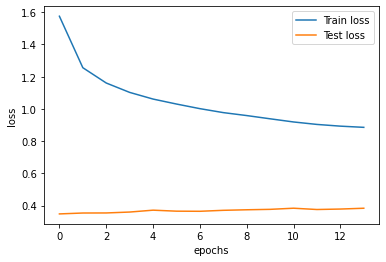

In [57]:
# Plot the Train and Validation Losses to check for overfitting
fig, ax = plt.subplots()
ax.plot(loss_plot, label='Train loss')
ax.plot(test_loss_plot, label='Test loss')
plt.legend()
plt.xlabel("epochs")
plt.ylabel("loss")
plt.show()

##**Evaluating the Captioning Model**##
- The evaluate function is similar to the training loop, except we don't use Teacher Forcing here. The input to Decoder at each time step is its previous predictions, along with the hidden state and the ENCODER output.
- Few key points to remember while making predictions.
1. Stop predicting when the model predicts the end token.
2. Store the attention weights for every time step.

###**Evaluating Test Set - Greedy**
Evaluate all test images - how does the model perform

In [58]:
# Greedy Approach
def greedySearch(image):
    hidden = decoder.reset_state(batch_size=1)

    temp_input = tf.expand_dims(load_image(image)[0], 0)
    img_tensor_val = image_features_extract_model(temp_input)
    img_tensor_val = tf.reshape(img_tensor_val, (img_tensor_val.shape[0], -1, img_tensor_val.shape[3]))

    features = encoder(img_tensor_val)

    dec_input = tf.expand_dims([tokenizer.word_index['<start>']], 0) # Start token is <start> for LSTM
    result = []     # need for plot_attention()

    for i in range(max_length):
        predictions, hidden, attention_weights = decoder(dec_input, features, hidden)

        predicted_id = tf.argmax(predictions[0]).numpy()
        # carol fix maybe
        # if tokenizer_test.index_word[predicted_id] != '<end>':
        # next line necessary for plot_attention()
        result.append(tokenizer.index_word[predicted_id]) # Store the result or word predicted
        
        if tokenizer.index_word[predicted_id] == '<end>': # if you reach <end> token then return the result
            return result

        dec_input = tf.expand_dims([predicted_id], 0) # Decoder input is the word predicted at previous timestep

    return result   

###**Greedy - Overall Evaluation**###
Evaluation across all 1000 test images (5000 captions)

In [59]:
# cumulative BLEU scores
from nltk.translate.bleu_score import sentence_bleu, SmoothingFunction
cc = SmoothingFunction()
bleu_1 = 0
bleu_2 = 0
bleu_3 = 0
bleu_4 = 0
i = 0
x = 0

nkeep = 5
pred_good, pred_bad, pred_avg, bleus = [], [], [], []

# during development, test=True to show print() steps
test = False
start = time()

for img in range(len(img_name_test)):
  # next 3 lines during development only
  x = x+1
  if x % 50 == 0:
    image = img_name_test[img]  #encode_test[pic].reshape((1,512))  
    cap_id = image.split()[0]
    fname = image.rsplit('/',1)[1]

    # Do prediction
    predicted = greedySearch(image) 
    if test==True:
      print('predicted: ' + ' '.join(predicted))

    # real_caption from caption_test[]
    real_caption = caption_test[img]
    first = real_caption.split(' ', 1)[1]
    real_caption = first.rsplit(' ', 1)[0]

    predicted_cap = ' '.join(predicted)
    # remove some junk
    predicted_cap = re.sub(' <end>', '', predicted_cap)  
    predicted_cap = re.sub('<unk>', '', predicted_cap)  

    if test==True:
      print(img, ',', fname)
      print('real caption : ' + real_caption)
      print('predicted cap: ' + predicted_cap)

    bleu    = sentence_bleu(real_caption, predicted_cap, weights=(1.0, 0, 0, 0), smoothing_function=cc.method4)
    bleu_0  = sentence_bleu(real_caption, predicted_cap, weights=(0, 1.0, 0, 0), smoothing_function=cc.method4)

    bleu_1 += sentence_bleu(real_caption, predicted_cap, weights=(1.0, 0, 0, 0), smoothing_function=cc.method4)
    bleu_2 += sentence_bleu(real_caption, predicted_cap, weights=(0, 1.0, 0, 0), smoothing_function=cc.method4)
    bleu_3 += sentence_bleu(real_caption, predicted_cap, weights=(0, 0, 1.0, 0), smoothing_function=cc.method4)
    bleu_4 += sentence_bleu(real_caption, predicted_cap, weights=(0, 0, 0, 1.0), smoothing_function=cc.method4)

    if test==True:
      print(bleu, ',', bleu_0)
     
    i += 1
    if i % 500 == 0:
      print("Processed {} {} {} {} {}".format(i, bleu_1/i, bleu_2/i, bleu_3/i, bleu_4/i))

    bleus.append(bleu)
    if bleu > 0.7:     # and len(pred_good) < nkeep:
        pred_good.append((bleu,img,fname,descriptions[fname],predicted_cap))
    elif bleu < 0.2:   # and len(pred_bad) < nkeep:
        pred_bad.append((bleu,img,fname,descriptions[fname],predicted_cap))
    elif bleu > 0.44 and bleu < 0.66:
        pred_avg.append((bleu,img,fname,descriptions[fname],predicted_cap))
    #elif bleu_0 > 0.44 and bleu_0 < 0.66:
    #    pred_avg.append((bleu_0,img,fname,descriptions[fname],predicted_cap))

#----------------------------------------------            
# Print out overall results for all Test images
print(' ')
print('Greedy Overall Evaluation')
print(f'rnn_type : {rnn_type}')
print(f'attention: {attention_choice}')
print(f"BELU_1 score        : {bleu_1/i*100}")
print(f"BELU_2 score        : {bleu_2/i*100}")
print(f"BELU_3 score        : {bleu_3/i*100}")
print(f"BELU_4 score        : {bleu_4/i*100}")
print('Time taken overall Greedy evaluation {} sec\n'.format(time() - start))

 
Greedy Overall Evaluation
rnn_type : GRU
attention: global
BELU_1 score        : 45.19879936011555
BELU_2 score        : 39.91962035400132
BELU_3 score        : 28.45426929607878
BELU_4 score        : 22.12697154234267
Time taken overall Greedy evaluation 21.915185928344727 sec



In [154]:
warnings.filterwarnings("ignore")

In [61]:
def plot_images(pred_bad, type='good', npic=5):
    def create_str(caption_true):
        strue = ""
        for s in list(caption_true):
            strue += "\n" + s
        return(strue)

    # only show image once    
    plot_done = []  
    plot_done.append(' ') 

    npix = 224
    target_size = (npix,npix,3)    
    count = 1
    pred = pred_bad.copy()
    pred.sort()

    # Either get top n (good) or bottom n (bad) images to show
    if type == 'good':
       #pred = pred[-npic:]
       pred = pred[:npic]
    else:
       pred = pred[:npic]

    fig = plt.figure(figsize=(10,npic*4))

    for pb in pred:
        # bleu,img,fname,descriptions[fname],predicted_cap
        bleu,pic,fname,actual,caption = pb
        
        ## images - get image from array, reshape and display in column 1
        image = img_name_test[pic]
        fname = image.rsplit('/', 1) 
        
        # only show image once
        if fname not in plot_done:
            # add file name to list
            plot_done.append(fname)
            #print(fname)

            x=plt.imread(image)
            ax = fig.add_subplot(npic,2,count,xticks=[],yticks=[])
            ax.imshow(x)

            count += 1
            ## Text - get true descriptions, predicted and BLEU-1 score and display in column 2
            actual = create_str(actual) # Split the 5 descriptions to separate lines
            
            ax = fig.add_subplot(npic,2,count)
            plt.axis('off')
            ax.plot()
            ax.set_xlim(0,1)
            ax.set_ylim(0,1)

            fontsize=13
            ax.text(0,0.5,"real caption:" + actual,  fontsize=fontsize)   # real caption
            ax.text(0,0.3,"prediction: " + caption, fontsize=fontsize)   # predicted
            ax.text(0,0.1,"BLEU: {}".format(bleu),fontsize=fontsize+1)
            count += 1
    plt.show()    

OK Caption


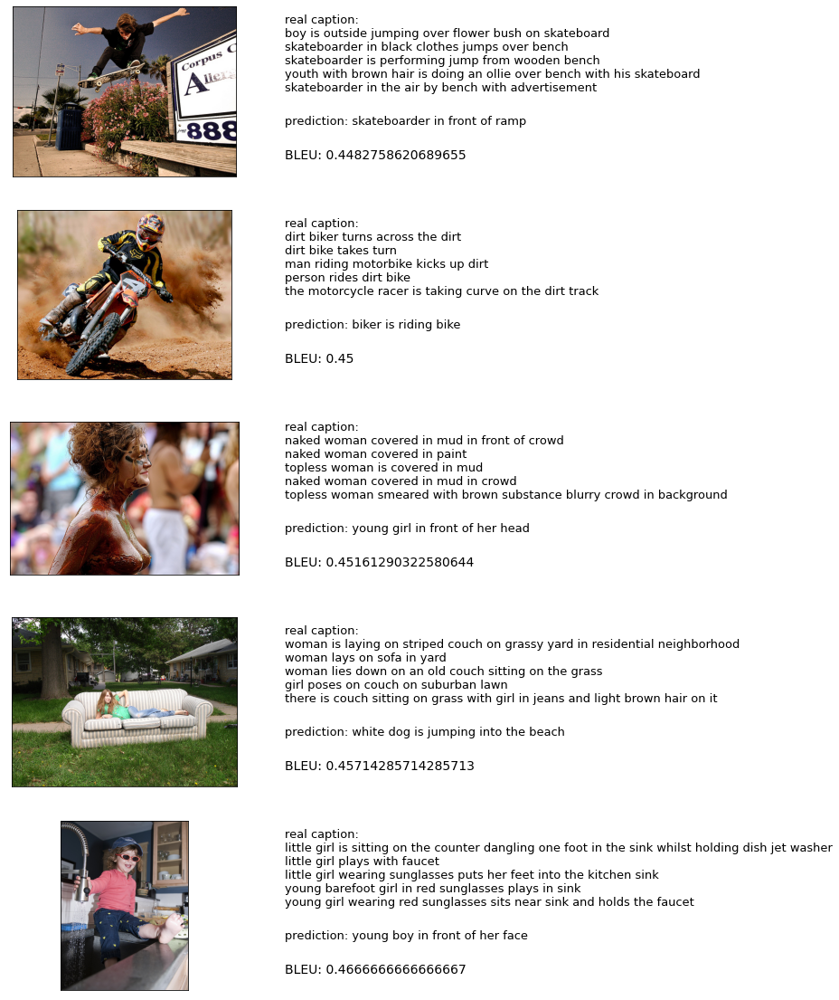

In [62]:
print("OK Caption")
plot_images(pred_avg, 'ok', 5)

Bad Caption


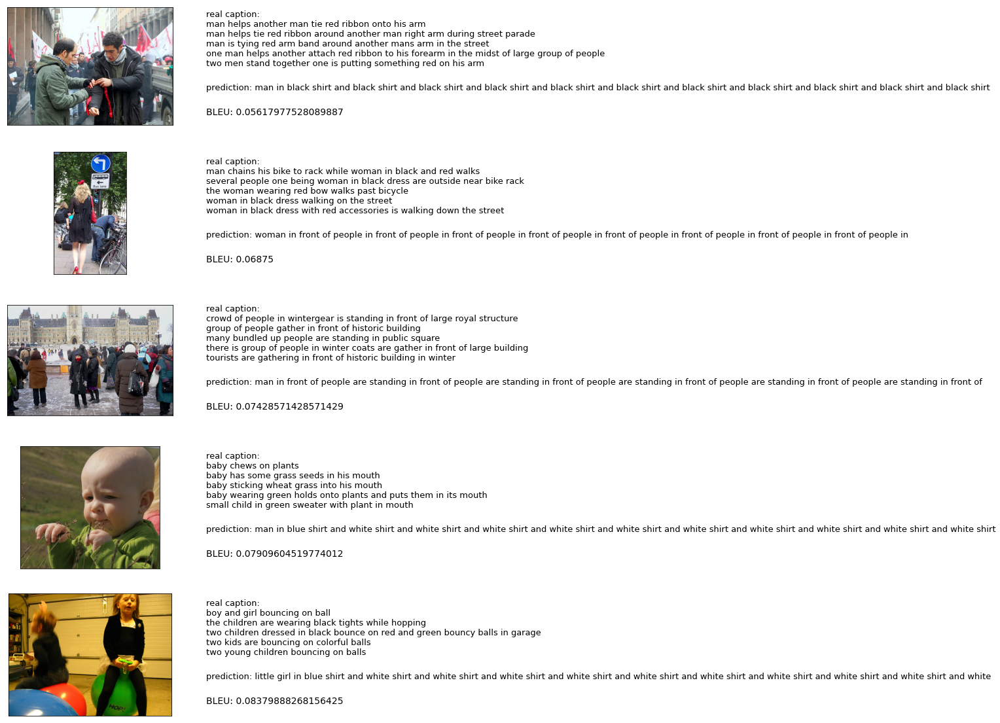

 
 
Good Caption


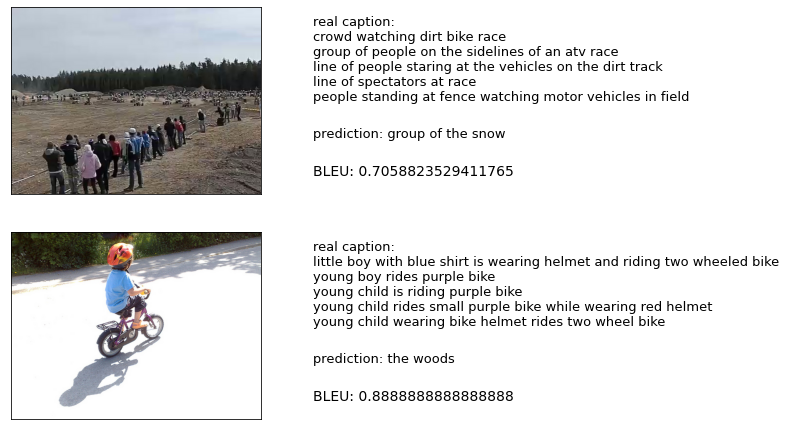

 
 
OK Caption


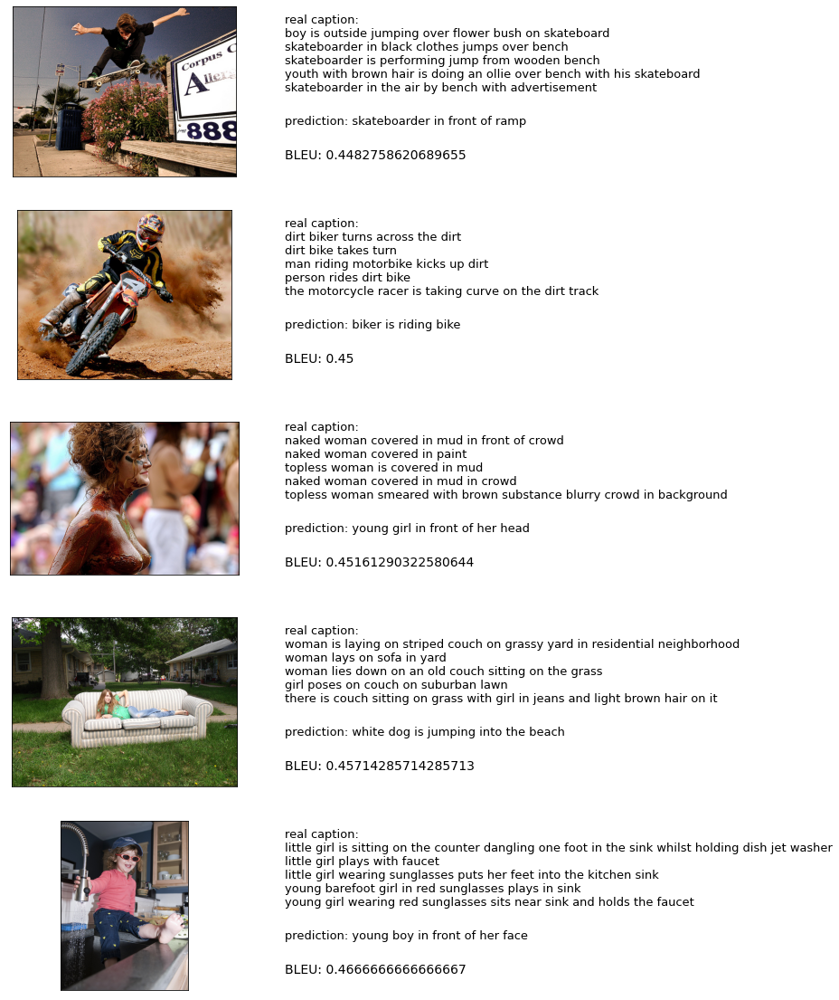

In [63]:
print("Bad Caption")
plot_images(pred_bad, 'bad')
print(' ')
print('=============================================')
print(' ')
print("Good Caption")
plot_images(pred_good, 'good')
print(' ')
print('=============================================')
print(' ')
print("OK Caption")
plot_images(pred_avg, 'OK')

In [64]:
pd.DataFrame(pred_good).to_csv('/content/drive/My Drive/' + 'pred_good_gru_greedy.csv')
pd.DataFrame(pred_bad).to_csv('/content/drive/My Drive/' + 'pred_bad_gru_greedy.csv')
pd.DataFrame(pred_avg).to_csv('/content/drive/My Drive/' + 'pred_avg_gru_greedy.csv')

In [65]:
pd.DataFrame(pred_bad)

,0,1,2,3,4
0,0.096045,349,1509786421_f03158adfc.jpg,"[boy points, boy points at something while man...",young boy in blue shirt and white shirt and wh...
1,0.083799,699,2160266952_a2ab39191b.jpg,"[boy and girl bouncing on ball, the children a...",little girl in blue shirt and white shirt and ...
2,0.085227,949,229862312_1a0ba19dab.jpg,[brown puppy is laying on its back in the gras...,two dogs are playing with brown dog is playing...
3,0.085714,999,2317714088_bcd081f926.jpg,[person has just thrown snowball and hit someo...,man in front of people are standing in front o...
4,0.093596,1399,2526041608_a9775ab8d7.jpg,[boy in yellow uniform carrying football is bl...,football players in red uniform and white unif...
5,0.079096,1599,2616643090_4f2d2d1a44.jpg,"[baby chews on plants, baby has some grass see...",man in blue shirt and white shirt and white sh...
6,0.056180,2599,3110649716_c17e14670e.jpg,[man helps another man tie red ribbon onto his...,man in black shirt and black shirt and black s...
7,0.074286,3049,3245912109_fdeef6b456.jpg,[crowd of people in wintergear is standing in ...,man in front of people are standing in front o...
8,0.083832,3499,3425851292_de92a072ee.jpg,[male athlete is wearing teal sweatband and sh...,man in blue shirt and white and white and whit...
9,0.083832,3799,3521374954_37371b49a4.jpg,[baby girl and little boy are standing next to...,young boy in blue shirt and blue shirt and blu...


###**Evaluating Test Set - Beam Search**
Beam search is an optimization of best-first search that reduces its memory requirements. Best-first search is a graph search which orders all partial solutions (states) according to some heuristic. But in beam search, only a predetermined number of best partial solutions are kept as candidates (Wikipedia https://en.wikipedia.org/wiki/Beam_search)

In [66]:
# Beam Search
def beam_search(image, beam_index = 3):

    start = [tokenizer.word_index['<start>']]
    
    # result[0][0] = index of the starting word
    # result[0][1] = probability of the word predicted
    result = [[start, 0.0]]

    attention_plot = np.zeros((max_length, attention_features_shape))

    hidden = decoder.reset_state(batch_size=1)

    temp_input = tf.expand_dims(load_image(image)[0], 0)
    img_tensor_val = image_features_extract_model(temp_input)

    # must resize image to width=8, height=8
    img_tensor_val = tf.image.resize_with_crop_or_pad(img_tensor_val, 8, 8)
    
    img_tensor_val = tf.reshape(img_tensor_val, (img_tensor_val.shape[0], -1, img_tensor_val.shape[3]))

    features = encoder(img_tensor_val)

    dec_input = tf.expand_dims([tokenizer.word_index['<start>']], 0)

    while len(result[0][0]) < max_length:
        i=0
        temp = []
        for s in result:

          predictions, hidden, attention_weights = decoder(dec_input, features, hidden)

          attention_plot[i] = tf.reshape(attention_weights, (-1, )).numpy()
          i=i+1
          # Getting the top <beam_index>(n) predictions
          word_preds = np.argsort(predictions[0])[-beam_index:]
          
          # creating a new list so as to put them via the model again
          for w in word_preds:       
            next_cap, prob = s[0][:], s[1]
            next_cap.append(w)
            prob += predictions[0][w]
            temp.append([next_cap, prob])
        result = temp
        # Sorting according to the probabilities
        result = sorted(result, reverse=False, key=lambda l: l[1])
        # Getting the top words
        result = result[-beam_index:]
        
        predicted_id = result[-1] # with Max Probability
        pred_list = predicted_id[0]
        
        prd_id = pred_list[-1] 
        if(prd_id!=3):
          dec_input = tf.expand_dims([prd_id], 0)  # Decoder input is the word predicted with highest probability among the top_k words predicted
        else:
          break

    result = result[-1][0]
    
    intermediate_caption = [tokenizer.index_word[i] for i in result]
    final_caption = []
    for i in intermediate_caption:
        if i != '<end>':
            final_caption.append(i)
            
        else:
            break

    attention_plot = attention_plot[:len(result), :]
    final_caption = ' '.join(final_caption[1:])
    
    return final_caption,attention_plot

###**Beam Search - Overall Evaluation**###
Evaluation across all 1000 test images (5000 captions)

In [69]:
# Beam Search - Overall Evaluation
# cumulative BLEU scores
from nltk.translate.bleu_score import sentence_bleu, SmoothingFunction

def beam_search_single(beam_index=3):
    cc = SmoothingFunction()
    bleu_1 = 0
    bleu_2 = 0
    bleu_3 = 0
    bleu_4 = 0
    i = 0
    x = 0

    pred_good, pred_bad, pred_avg, bleus = [], [], [], []

    # during development, test=True to show print() steps
    test = False
    start = time()

    for img in range(len(img_name_test)):
      # next 2 lines during development only
      x = x+1
      if x % 50 == 0:
        image = img_name_test[img]  #encode_test[pic].reshape((1,512))  
        cap_id = image.split()[0]
        fname = image.rsplit('/',1)[1]

        # Do prediction
        predicted, attention_plot = beam_search(image, beam_index) 

        # real_caption from caption_test[]
        real_caption = caption_test[img]
        first = real_caption.split(' ', 1)[1]
        real_caption = first.rsplit(' ', 1)[0]

        predicted_cap = predicted  # ' '.join(predicted)

        if test==True:
          print(img, ',', fname)
          print('real caption : ' + real_caption)
          print('predicted cap: ' + predicted_cap)

        bleu    = sentence_bleu(real_caption, predicted_cap, weights=(1.0, 0, 0, 0), smoothing_function=cc.method4)
        bleu_0  = sentence_bleu(real_caption, predicted_cap, weights=(0, 1.0, 0, 0), smoothing_function=cc.method4)

        bleu_1 += sentence_bleu(real_caption, predicted_cap, weights=(1.0, 0, 0, 0), smoothing_function=cc.method4)
        bleu_2 += sentence_bleu(real_caption, predicted_cap, weights=(0, 1.0, 0, 0), smoothing_function=cc.method4)
        bleu_3 += sentence_bleu(real_caption, predicted_cap, weights=(0, 0, 1.0, 0), smoothing_function=cc.method4)
        bleu_4 += sentence_bleu(real_caption, predicted_cap, weights=(0, 0, 0, 1.0), smoothing_function=cc.method4)
        
        i += 1
        if i % 500 == 0:
          print("Processed {} {} {} {} {}".format(i, bleu_1/i, bleu_2/i, bleu_3/i, bleu_4/i))

        bleus.append(bleu)
        if bleu > 0.7:  # and len(pred_good) < nkeep:
            pred_good.append((bleu,img,fname,descriptions[fname],predicted_cap))
        elif bleu < 0.2:# and len(pred_bad) < nkeep:
            pred_bad.append((bleu,img,fname,descriptions[fname],predicted_cap))
        elif bleu > 0.44 and bleu < 0.66:
            pred_avg.append((bleu,img,fname,descriptions[fname],predicted_cap))
        elif bleu_0 > 0.44 and bleu_0 < 0.66:
            pred_avg.append((bleu_0,img,fname,descriptions[fname],predicted_cap))

    #----------------------------------------------            
    # Print out overall results for all Test images
    print(f'Beam Search Overall Evaluation')
    print(f'rnn_type : {rnn_type}')
    print(f'attention: {attention_choice}')    
    print(f"BELU_1 score (beam={beam_index}): {bleu_1/i*100}")
    print(f"BELU_2 score (beam={beam_index}): {bleu_2/i*100}")
    print(f"BELU_3 score (beam={beam_index}): {bleu_3/i*100}")
    print(f"BELU_4 score (beam={beam_index}): {bleu_4/i*100}")
    print ('Time taken overall Beam Search evaluation {} sec\n'.format(time() - start))

In [70]:
beam_search_single(beam_index=3)
pd.DataFrame(pred_good).to_csv('/content/drive/My Drive/' + 'pred_good_gru_beam_3.csv')
pd.DataFrame(pred_bad).to_csv('/content/drive/My Drive/' + 'pred_bad_gru_beam_3.csv')
pd.DataFrame(pred_avg).to_csv('/content/drive/My Drive/' + 'pred_avg_gru_beam_3.csv')

Beam Search Overall Evaluation
rnn_type : GRU
attention: global
BELU_1 score (beam=3): 44.43818316580997
BELU_2 score (beam=3): 40.067402567918634
BELU_3 score (beam=3): 28.520193962197286
BELU_4 score (beam=3): 22.163863419138075
Time taken overall Beam Search evaluation 39.55661344528198 sec



In [71]:
beam_search_single(beam_index=7)
pd.DataFrame(pred_good).to_csv('/content/drive/My Drive/' + 'pred_good_gru_beam_7.csv')
pd.DataFrame(pred_bad).to_csv('/content/drive/My Drive/' + 'pred_bad_gru_beam_7.csv')
pd.DataFrame(pred_avg).to_csv('/content/drive/My Drive/' + 'pred_avg_gru_beam_7.csv')

Beam Search Overall Evaluation
rnn_type : GRU
attention: global
BELU_1 score (beam=7): 44.43818316580997
BELU_2 score (beam=7): 40.067402567918634
BELU_3 score (beam=7): 28.520193962197286
BELU_4 score (beam=7): 22.163863419138075
Time taken overall Beam Search evaluation 91.91671061515808 sec



 
OK Caption - Beam=3


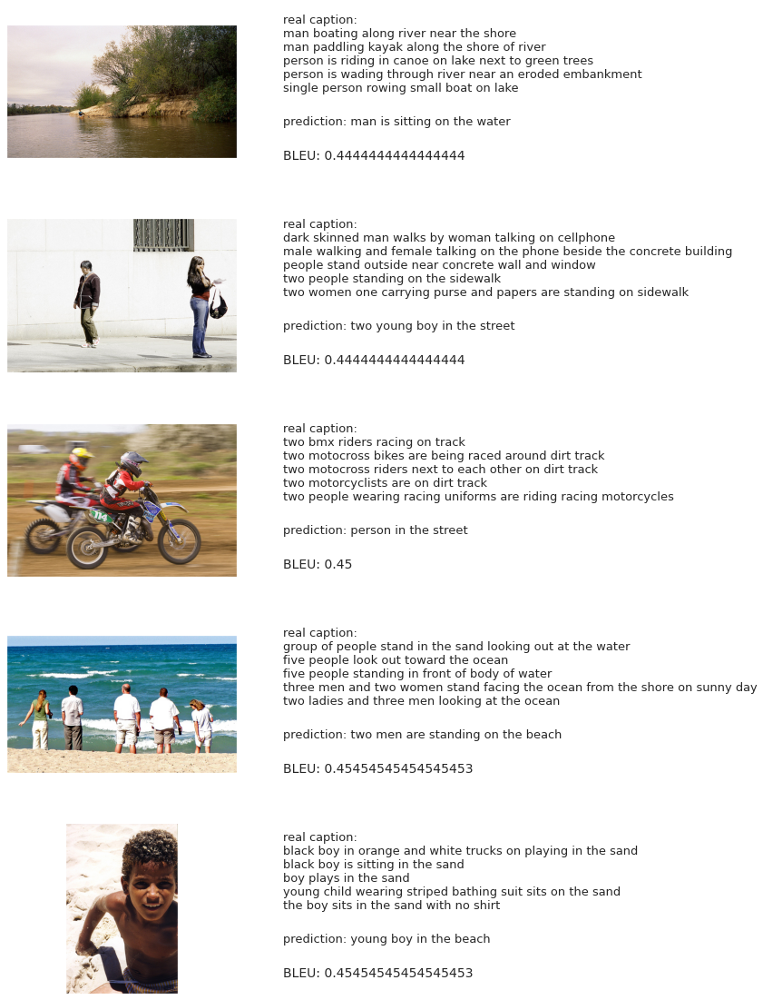

In [294]:
print("OK Caption - Beam=3")
plot_images(pred_avg, 'OK')

In [295]:
beam_search_single(beam_index=5)
pd.DataFrame(pred_good).to_csv('/content/drive/My Drive/' + 'pred_good_beam_5.csv')
pd.DataFrame(pred_bad).to_csv('/content/drive/My Drive/' + 'pred_bad_beam_5.csv')

 
Beam Search Overall Evaluation
rnn_type : LSTM
attention: global
BELU_1 score (beam=5): 40.47778293766323
BELU_2 score (beam=5): 41.191544655249906
BELU_3 score (beam=5): 29.07577610064151
BELU_4 score (beam=5): 22.49477524080674
Time taken overall Beam Search evaluation 178.66583251953125 sec



In [296]:
beam_search_single(beam_index=10)
pd.DataFrame(pred_good).to_csv('/content/drive/My Drive/' + 'pred_good_beam_10.csv')
pd.DataFrame(pred_bad).to_csv('/content/drive/My Drive/' + 'pred_bad_beam_10.csv')

 
Beam Search Overall Evaluation
rnn_type : LSTM
attention: global
BELU_1 score (beam=10): 40.47778293766323
BELU_2 score (beam=10): 41.191544655249906
BELU_3 score (beam=10): 29.07577610064151
BELU_4 score (beam=10): 22.49477524080674
Time taken overall Beam Search evaluation 424.917147397995 sec



## **Evaluating Single Images**

In [116]:
# Greedy Approach
def evaluate_greedy(image):
    attention_plot = np.zeros((max_length, attention_features_shape))

    hidden = decoder.reset_state(batch_size=1)

    temp_input = tf.expand_dims(load_image(image)[0], 0)
    img_tensor_val = image_features_extract_model(temp_input)
    # must resize image to width=8, height=8
    img_tensor_val = tf.image.resize_with_crop_or_pad(img_tensor_val, 8, 8)      
    img_tensor_val = tf.reshape(img_tensor_val, (img_tensor_val.shape[0], -1, img_tensor_val.shape[3]))

    features = encoder(img_tensor_val)

    dec_input = tf.expand_dims([tokenizer.word_index['<start>']], 0) # Start token is <start> for LSTM
    result = []     # need for plot_attention()
    result_cap = '' # required for BLUE assessment

    for i in range(max_length):
        predictions, hidden, attention_weights = decoder(dec_input, features, hidden)

        attention_plot[i] = tf.reshape(attention_weights, (-1, )).numpy()

        predicted_id = tf.argmax(predictions[0]).numpy()
        # carol fix maybe
        if tokenizer_test.index_word[predicted_id] != '<end>':
          # next line necessary for plot_attention()
          result.append(tokenizer_test.index_word[predicted_id]) # Store the result or word predicted
          # next line necessary for BLUE caption assessment
          result_cap = result_cap + ' ' + tokenizer_test.index_word[predicted_id]
        
        if tokenizer_test.index_word[predicted_id] == '<end>': # if you reach <end> token then return the result
            return result, attention_plot, result_cap

        dec_input = tf.expand_dims([predicted_id], 0) # Decoder input is the word predicted at previous timestep

    attention_plot = attention_plot[:len(result), :]
    return result, attention_plot, result_cap


In [117]:
# Beam Search
def evaluate_beam(image, beam_index = 3):

    start = [tokenizer.word_index['<start>']]
    
    # result[0][0] = index of the starting word
    # result[0][1] = probability of the word predicted
    result = [[start, 0.0]]

    attention_plot = np.zeros((max_length, attention_features_shape))

    hidden = decoder.reset_state(batch_size=1)

    temp_input = tf.expand_dims(load_image(image)[0], 0)
    img_tensor_val = image_features_extract_model(temp_input)
    # must resize image to width=8, height=8
    img_tensor_val = tf.image.resize_with_crop_or_pad(img_tensor_val, 8, 8)
    img_tensor_val = tf.reshape(img_tensor_val, (img_tensor_val.shape[0], -1, img_tensor_val.shape[3]))

    features = encoder(img_tensor_val)

    dec_input = tf.expand_dims([tokenizer.word_index['<start>']], 0)

    while len(result[0][0]) < max_length:
        i=0
        temp = []
        for s in result:

          predictions, hidden, attention_weights = decoder(dec_input, features, hidden)

          attention_plot[i] = tf.reshape(attention_weights, (-1, )).numpy()
          i=i+1
          # Getting the top <beam_index>(n) predictions
          word_preds = np.argsort(predictions[0])[-beam_index:]
          
          # creating a new list so as to put them via the model again
          for w in word_preds:       
            next_cap, prob = s[0][:], s[1]
            next_cap.append(w)
            prob += predictions[0][w]
            temp.append([next_cap, prob])
        result = temp
        # Sorting according to the probabilities
        result = sorted(result, reverse=False, key=lambda l: l[1])
        # Getting the top words
        result = result[-beam_index:]
        
        predicted_id = result[-1] # with Max Probability
        pred_list = predicted_id[0]
        
        prd_id = pred_list[-1] 
        if(prd_id!=3):
          dec_input = tf.expand_dims([prd_id], 0)  # Decoder input is the word predicted with highest probability among the top_k words predicted
        else:
          break

    result = result[-1][0]
    
    intermediate_caption = [tokenizer.index_word[i] for i in result]
    final_caption = []
    for i in intermediate_caption:
        if i != '<end>':
            final_caption.append(i)
            
        else:
            break

    attention_plot = attention_plot[:len(result), :]
    final_caption = ' '.join(final_caption[1:])
    return final_caption,attention_plot

In [124]:
# Let's create a helper function to visualise the attention points that predicts the words.
def plot_attention(image, result, attention_plot):
    temp_image = np.array(Image.open(image))

    fig = plt.figure(figsize=(10, 10))
    len_result = len(result)
    print('len_result: ' + str(len_result))
    for l in range(len_result):
        temp_att = np.resize(attention_plot[l], (8, 8))
        ax = fig.add_subplot((len_result//2)+2, len_result//2, l+1)
        ax.set_title(result[l])
        img = ax.imshow(temp_image)
        ax.imshow(temp_att, cmap='gray', alpha=0.6, extent=img.get_extent())

    plt.tight_layout()
    plt.show()

###**Prediction and Evaluation Function for both Evaluation types: greedy & beam**##

In [107]:
# 1) Let's checkout few captions generated using Greedy Search vs Beam Search
# test image = '3445428367_25bafffe75.jpg' => black dog is digging in the snow
# test rid = 5994 => the blond girl is jumping up in the air

from PIL import Image
from nltk.translate.bleu_score import sentence_bleu, SmoothingFunction
import re
warnings.filterwarnings("ignore")

def image_cap_predict(eval_type='greedy', beam_index=5, rid=5994, image='413231421_43833a11f5.jpg'):

    if rid==5994 and image=='413231421_43833a11f5.jpg':
      # pick random id, as no image id or name passed
      rid = np.random.randint(0, len(img_name_test))
      image = img_name_test[rid]
    elif rid!=5994:
      # use image id passed in   
      # image = img_name_test[rid]
      print('rid: ', rid)
      image = img_name_test[rid]
    else:
      # use image name passed in
      image = image_dir + '/' + image

    print(image)
    start = time()    
    result_cap = ''

    if eval_type == 'greedy':
      # Greedy evaluation method
      result, attention_plot, result_cap = evaluate_greedy(image)
    else:
      result, attention_plot = evaluate_beam(image, beam_index)

    # print('len(attention_plot) = ' + str(len(attention_plot)))

    # result is in this format:  ['woman', 'plays', 'volleyball', '<end>']
    # We need to remove <end> and join the list elements into a sentence. Also we need to remove <unk> from real_captions

    #real_caption = ' '.join([tokenizer.index_word[i] for i in caption_test[rid] if i not in [0]])
    real_caption = caption_test[rid]
    first = real_caption.split(' ', 1)[1]
    real_caption = first.rsplit(' ', 1)[0]
    print(caption_test[rid])

    #remove "<unk>" in result
    for i in result:
        if i=="<unk>":
            result.remove(i)

    #remove "<end>" in result_cap
    result_cap = re.sub('<end>', '', result_cap)

    #remove <end> from result         
    result_join = ''.join(str(result))
    result_final = result_join.rsplit(' ', 1)[0]

    real_appn = []
    real_appn.append(real_caption.split())
    reference = real_appn
    candidate = result_final.split()

    print(f'Evaulation method   : {eval_type}')
    print ('Real Caption        :', real_caption)

    cc = SmoothingFunction()
    bleu_1 = 0
    bleu_2 = 0
    bleu_3 = 0
    bleu_4 = 0

    if eval_type=='greedy':
      #score = sentence_bleu(real_caption, result_cap.strip(), weights=(0.5, 0.5, 0, 0))
      #bleu    = sentence_bleu(real_caption, result_cap.strip(), weights=(1.0, 0, 0, 0), smoothing_function=cc.method4)
      bleu_1 += sentence_bleu(real_caption, result_cap.strip(), weights=(0.5, 0.5, 0, 0), smoothing_function=cc.method4)
      bleu_2 += sentence_bleu(real_caption, result_cap.strip(), weights=(0, 1.0, 0, 0), smoothing_function=cc.method4)
      bleu_3 += sentence_bleu(real_caption, result_cap.strip(), weights=(0, 0, 1.0, 0), smoothing_function=cc.method4)
      bleu_4 += sentence_bleu(real_caption, result_cap.strip(), weights=(0, 0, 0, 1.0), smoothing_function=cc.method4)
      print('Prediction Caption  :', result_cap.strip())
    else:
      #score = sentence_bleu(reference, candidate, weights=(0.5, 0.5, 0, 0))
      #bleu    = sentence_bleu(reference, candidate, weights=(1.0, 0, 0, 0), smoothing_function=cc.method4)
      bleu_1 += sentence_bleu(reference, candidate, weights=(1.0, 0, 0, 0), smoothing_function=cc.method4)
      bleu_2 += sentence_bleu(reference, candidate, weights=(0, 1.0, 0, 0), smoothing_function=cc.method4)
      bleu_3 += sentence_bleu(reference, candidate, weights=(0, 0, 1.0, 0), smoothing_function=cc.method4)
      bleu_4 += sentence_bleu(reference, candidate, weights=(0, 0, 0, 1.0), smoothing_function=cc.method4)
      print(f'Prediction Caption  :', result_final)

    print(f"BELU_1 score        : {bleu_1*100}")
    print(f"BELU_2 score        : {bleu_2*100}")
    print(f"BELU_3 score        : {bleu_3*100}")
    print(f"BELU_4 score        : {bleu_4*100}")
    print(f"time took to Predict: {round(time()-start)} sec")
    print(f'image id            : {rid}')

    if eval_type=='greedy':
      plot_attention(image, result, attention_plot)
    else:
      plot_attention(image, candidate, attention_plot) #candidate

    return image, rid


In [ ]:
rid = np.random.randint(0, len(img_name_test))
print(rid)
caption_test[rid]

rid:  1274
/root/.keras/datasets/Flicker8k_Dataset/2473791980_805c819bd4.jpg
<start> waterskier cuts through the blue water with sailboats in the background <end>
Evaulation method   : greedy
Real Caption        : waterskier cuts through the blue water with sailboats in the background
Prediction Caption  : man the in head
BELU_1 score        : 43.28679707428299
BELU_2 score        : 35.132752517815376
BELU_3 score        : 25.998695255751276
BELU_4 score        : 20.63409879203853
time took to Predict: 0 sec
image id            : 1274


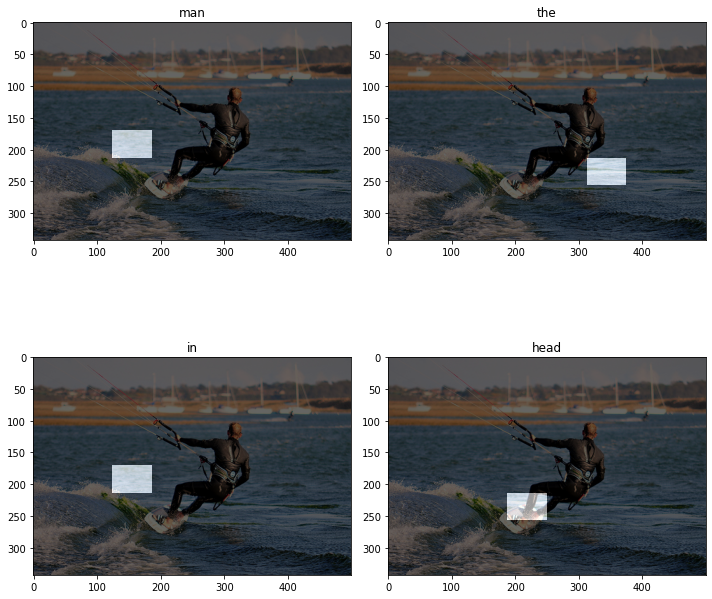

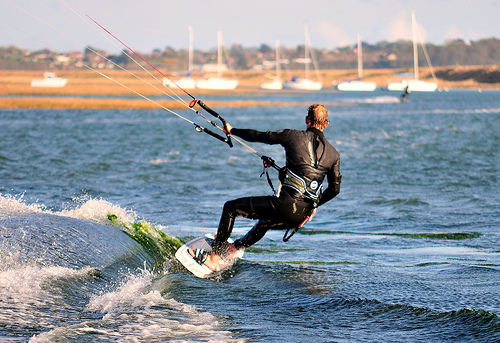

In [119]:
# TEST 1.A - GREEDY
rid = np.random.randint(0, len(img_name_test))
image, rid = image_cap_predict(eval_type='greedy', rid=1274)
# opening the image, does not work inside the function
Image.open(image)

rid:  1274
/root/.keras/datasets/Flicker8k_Dataset/2473791980_805c819bd4.jpg
<start> waterskier cuts through the blue water with sailboats in the background <end>
Evaulation method   : beam
Real Caption        : waterskier cuts through the blue water with sailboats in the background
Prediction Caption  : man in the
BELU_1 score        : 4.6322300815201025
BELU_2 score        : 3.4741725611400773
BELU_3 score        : 1.0606223628594014
BELU_4 score        : 0.9201648321371549
time took to Predict: 0 sec
image id            : 1274
len_result: 3


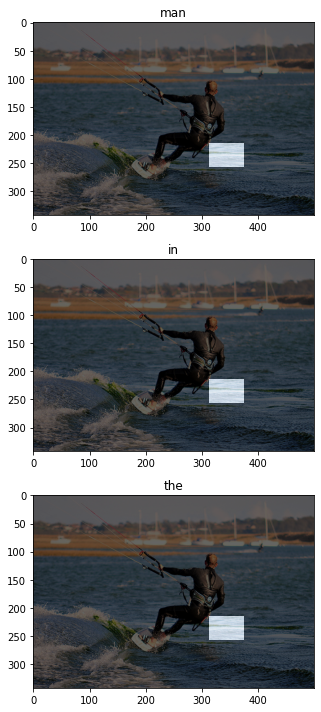

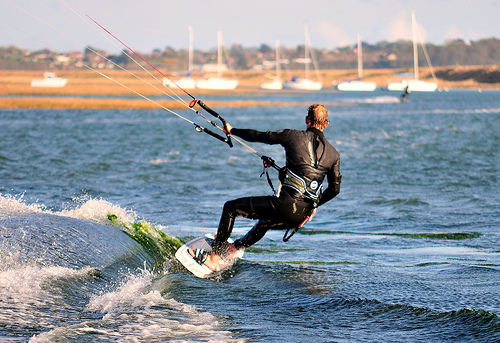

In [125]:
# TEST 1.B - BEAM (3)
image, rid = image_cap_predict(eval_type='beam', beam_index=3, rid=1274)
# opening the image, does not work inside the function
Image.open(image)

In [ ]:
# TEST 1.C - BEAM (7)
image, rid = image_cap_predict(eval_type='beam', beam_index=7, rid=1274)
# opening the image, does not work inside the function
Image.open(image)

rid:  2235
/root/.keras/datasets/Flicker8k_Dataset/2945036454_280fa5b29f.jpg
<start> dog is jumping in the air trying to catch red frisbee <end>
Evaulation method   : greedy
Real Caption        : dog is jumping in the air trying to catch red frisbee
Prediction Caption  : white with is running the in ball
BELU_1 score        : 38.68393677853751
BELU_2 score        : 41.15229152886189
BELU_3 score        : 29.154533081347346
BELU_4 score        : 22.573371902467034
time took to Predict: 0 sec
image id            : 2235
len_result: 7


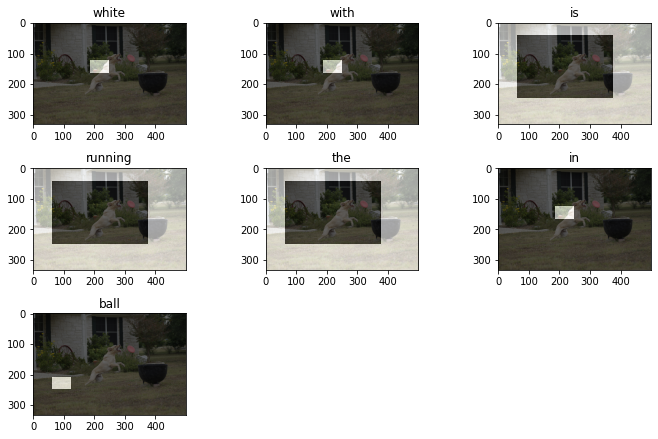

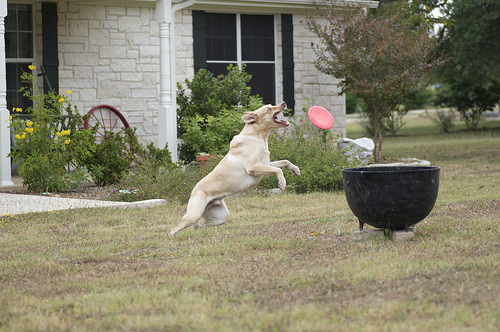

In [128]:
# TEST 1.A - GREEDY
rid = np.random.randint(0, len(img_name_test))
image, rid = image_cap_predict(eval_type='greedy', rid=rid)
# opening the image, does not work inside the function
Image.open(image)

rid:  2235
/root/.keras/datasets/Flicker8k_Dataset/2945036454_280fa5b29f.jpg
<start> dog is jumping in the air trying to catch red frisbee <end>
Evaulation method   : beam
Real Caption        : dog is jumping in the air trying to catch red frisbee
Prediction Caption  : white dog is standing in the
BELU_1 score        : 28.973213900471883
BELU_2 score        : 17.38392834028313
BELU_3 score        : 9.071983891284658
BELU_4 score        : 7.505296964613371
time took to Predict: 1 sec
image id            : 2235
len_result: 6


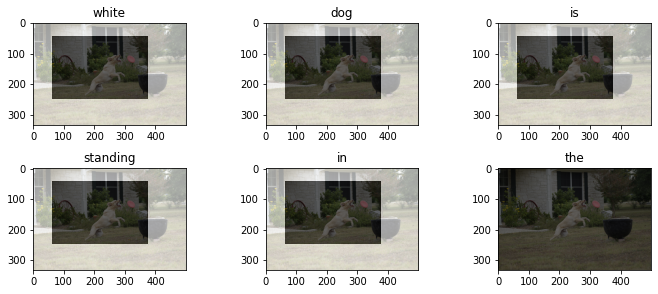

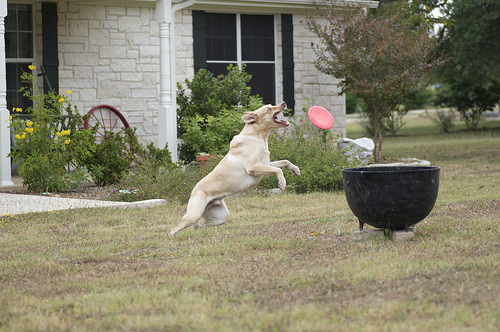

In [130]:
# TEST 1.C - BEAM (5)
image, rid = image_cap_predict(eval_type='beam', beam_index=5, rid=2235)
# opening the image, does not work inside the function
Image.open(image)

/root/.keras/datasets/Flicker8k_Dataset/3255620561_7644747791.jpg
len(attention_plot) = 34
Evaulation method   : greedy
Real Caption        : snow covered wooded area with structure and person in white top and orange pants in midair
Prediction Caption  : the skier jumps high in the snow covered in the woods
BELU_1 score        : 37.67857395322849
BELU_2 score        : 44.26045386052478
BELU_3 score        : 30.68093346172131
BELU_4 score        : 23.47774281143185
time took to Predict: 0 sec
image id            : 5397
len_result: 11


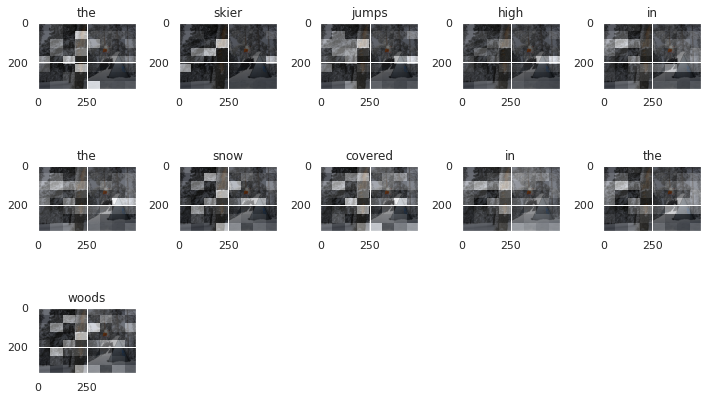

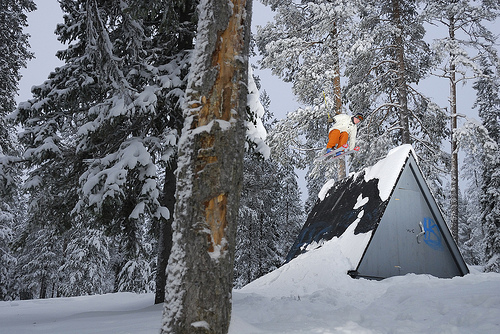

In [ ]:
# TEST 2.A - Greedy
image, rid = image_cap_predict(eval_type='greedy', rid=5397)
# opening the image, does not work inside the function
Image.open(image)

Test 3A - Greedy
/root/.keras/datasets/Flicker8k_Dataset/2506892928_7e79bec613.jpg
len(attention_plot) = 34
Evaulation method   : greedy
Real Caption        : three kids palying with toy cat in garden
Prediction Caption  : two young girl in the camera
BELU_1 score        : 44.71681527801788
BELU_2 score        : 39.99187137216747
BELU_3 score        : 28.56728107151975
BELU_4 score        : 22.219713159857726
time took to Predict: 0 sec
image id            : 2966
len_result: 7


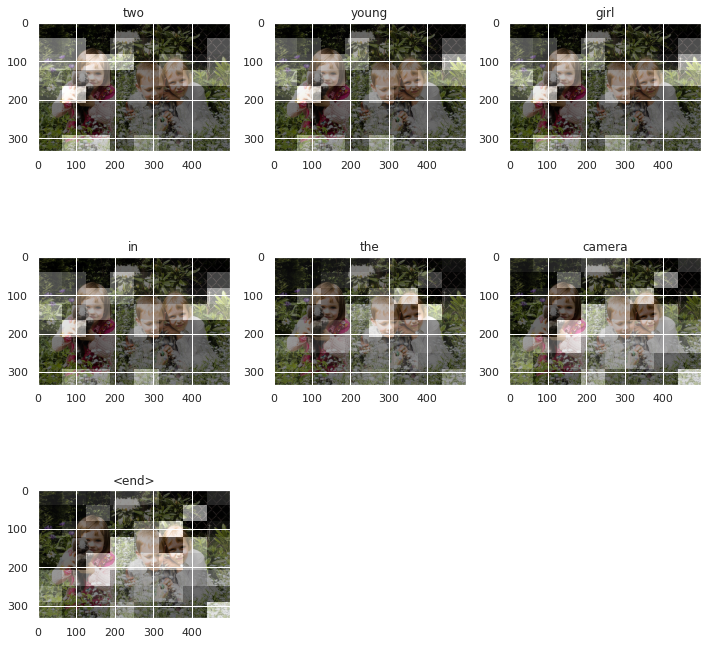

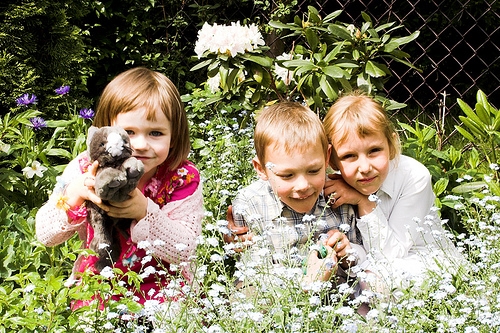

In [ ]:
print('Test 3A - Greedy')
image, rid = image_cap_predict(eval_type='greedy', rid=2966)
# opening the image, does not work inside the function
Image.open(image)

In [ ]:
print('Test 3B - Beam=2')
image, rid = image_cap_predict(eval_type='beam', beam_index=2, rid=2966)

print('Test 3C - Beam=4')
image, rid = image_cap_predict(eval_type='beam', beam_index=4, rid=2966)

print('Test 3D - Beam=6')
image, rid = image_cap_predict(eval_type='beam', beam_index=6, rid=2966)

# opening the image, does not work inside the function
#Image.open(image)

Test 4A - Greedy
/root/.keras/datasets/Flicker8k_Dataset/498957941_f0eda42787.jpg
len(attention_plot) = 34
Evaulation method   : greedy
Real Caption        : boy in blue shirt is running
Prediction Caption  : the boy running across the background
BELU_1 score        : 38.38441246195499
BELU_2 score        : 41.93418110910073
BELU_3 score        : 29.544807868984797
BELU_4 score        : 22.806632203171702
time took to Predict: 0 sec
image id            : 1901


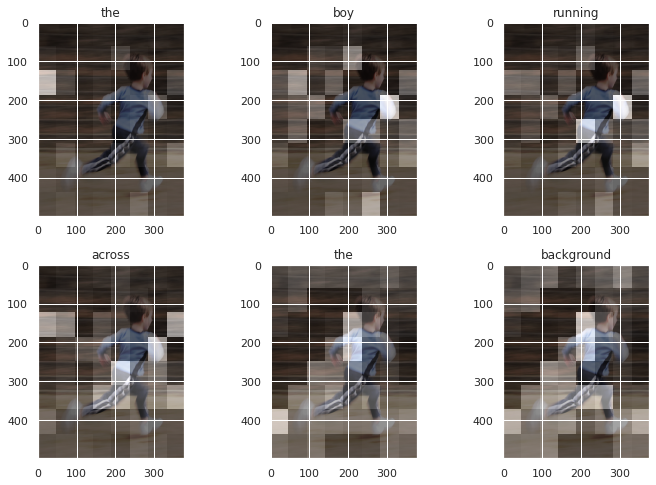

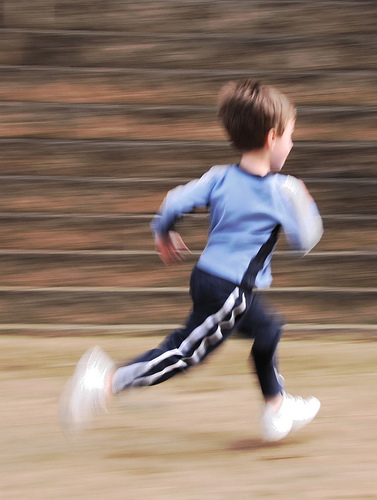

In [ ]:
print('Test 4A - Greedy')
image, rid = image_cap_predict(eval_type='greedy', rid=1901)
# opening the image, does not work inside the function
Image.open(image)